### 1. Importing

In [1]:
import pandas as pd
import pyspark.sql.functions as f
from functools import reduce
from pyspark.sql import SparkSession
from sklearn.ensemble import RandomForestRegressor
from pyspark.sql.functions import udf, col
from pyspark.sql.types import TimestampType
import matplotlib.pyplot as plt
from pyspark.sql.window import Window
from skforecast.recursive import ForecasterRecursive
from sklearn.tree import DecisionTreeRegressor
import pmdarima as pm
from pyspark.ml.feature import VectorAssembler
from pyspark.ml import Pipeline
import esmaplotly as epy

/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### 2. Files

In [ ]:
spark = SparkSession.builder.appName("ExcelToSpark").getOrCreate()
file1_pd = pd.read_csv("fl1.csv")
file2_pd = pd.read_csv("fl2.csv")

file1_spark = spark.createDataFrame(file1_pd)
file2_spark = spark.createDataFrame(file2_pd)

df_joined = file1_spark.join(file2_spark, on='KEY', how='left')
df_joined.printSchema()
df_joined.show(10)

25/05/22 08:56:33 WARN Utils: Your hostname, Mels-MacBook-Pro.local resolves to a loopback address: 127.0.0.1; using 192.168.1.133 instead (on interface en0)
25/05/22 08:56:33 WARN Utils: Set SPARK_LOCAL_IP if you need to bind to another address
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
25/05/22 08:56:33 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


root
 |-- KEY: string (nullable = true)
 |-- TITLE: string (nullable = true)
 |-- TITLE_COMPL: double (nullable = true)
 |-- PROSP3_MEASURE: string (nullable = true)
 |-- FREQ: string (nullable = true)
 |-- S_NCA: string (nullable = true)
 |-- PROSP3_SECURITIES_TYPE: string (nullable = true)
 |-- MTR: string (nullable = true)
 |-- CURR_ISSNC: string (nullable = true)
 |-- PROSP3_OFFER_TYPE: string (nullable = true)
 |-- PROSP3_DOCUMENT_TYPE: string (nullable = true)
 |-- SEC_TYPE_CFI: string (nullable = true)
 |-- ISSUER_COU: string (nullable = true)
 |-- ISSUER_SECTOR: string (nullable = true)
 |-- PROSP3_PRSP_TYPE: string (nullable = true)
 |-- PROSP3_SME_CAT_TYPE: string (nullable = true)
 |-- PROSP3_PSSP: string (nullable = true)
 |-- PROSP3_VENUE: string (nullable = true)
 |-- PROSP3_LNGG: string (nullable = true)
 |-- MV: string (nullable = true)
 |-- GROUP: string (nullable = true)
 |-- TIME_PERIOD: string (nullable = true)
 |-- PK: double (nullable = true)
 |-- OBS_VALUE: doubl

25/05/22 08:56:39 WARN TaskSetManager: Stage 1 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.


+--------------------+--------------------+-----------+--------------------+-------------+---------+----------------------+---+----------+-----------------+--------------------+------------+----------+-------------+----------------+-------------------+-----------+------------+-----------+---+--------------------+-----------+----------+------------+
|                 KEY|               TITLE|TITLE_COMPL|      PROSP3_MEASURE|         FREQ|    S_NCA|PROSP3_SECURITIES_TYPE|MTR|CURR_ISSNC|PROSP3_OFFER_TYPE|PROSP3_DOCUMENT_TYPE|SEC_TYPE_CFI|ISSUER_COU|ISSUER_SECTOR|PROSP3_PRSP_TYPE|PROSP3_SME_CAT_TYPE|PROSP3_PSSP|PROSP3_VENUE|PROSP3_LNGG| MV|               GROUP|TIME_PERIOD|        PK|   OBS_VALUE|
+--------------------+--------------------+-----------+--------------------+-------------+---------+----------------------+---+----------+-----------------+--------------------+------------+----------+-------------+----------------+-------------------+-----------+------------+-----------+---+-----

----------------------------------------
Exception occurred during processing of request from ('127.0.0.1', 50407)
Traceback (most recent call last):
  File "/opt/anaconda3/envs/datasci/lib/python3.12/socketserver.py", line 318, in _handle_request_noblock
    self.process_request(request, client_address)
  File "/opt/anaconda3/envs/datasci/lib/python3.12/socketserver.py", line 349, in process_request
    self.finish_request(request, client_address)
  File "/opt/anaconda3/envs/datasci/lib/python3.12/socketserver.py", line 362, in finish_request
    self.RequestHandlerClass(request, client_address, self)
  File "/opt/anaconda3/envs/datasci/lib/python3.12/socketserver.py", line 761, in __init__
    self.handle()
  File "/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/pyspark/accumulators.py", line 295, in handle
    poll(accum_updates)
  File "/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/pyspark/accumulators.py", line 267, in poll
    if self.rfile in r and func():
  

### 3. Time Parser

In [3]:
from pyspark.sql import functions as f
from pyspark.sql import DataFrame

def parse_time_period(df: DataFrame, input_col: str = 'TIME_PERIOD', output_col: str = 'parsed_date') -> DataFrame:
    parts = f.split(f.col(input_col), '-')

    # Quarterly
    is_quarter = f.col(input_col).like('%-Q%')
    year_q = f.split(f.col(input_col), '-Q').getItem(0)
    q_num = f.split(f.col(input_col), '-Q').getItem(1).cast('int')
    q_month = f.expr("(int(split(" + input_col + ", '-Q')[1]) - 1) * 3 + 1")
    q_month_padded = f.lpad(q_month.cast('string'), 2, '0')
    date_q = f.to_date(f.concat_ws('-', year_q, q_month_padded, f.lit('01')))

    # Monthly
    is_month = (f.size(parts) == 2) & (~is_quarter)
    year_m = parts.getItem(0)
    month_m = f.lpad(parts.getItem(1), 2, '0')
    date_m = f.to_date(f.concat_ws('-', year_m, month_m, f.lit('01')))

    # Yearly
    is_year = (f.length(f.col(input_col)) == 4) & f.col(input_col).rlike('^[0-9]{4}$')
    year_y = f.col(input_col)
    date_y = f.to_date(f.concat_ws('-', year_y, f.lit('01'), f.lit('01')))

    # Combine with when
    parsed_date_col = (
        f.when(is_quarter, date_q)
         .when(is_month, date_m)
         .when(is_year, date_y)
         .otherwise(f.lit(None).cast('date'))
    )

    return df.withColumn(output_col, parsed_date_col)

df_joined = parse_time_period(df_joined, input_col='TIME_PERIOD', output_col='parsed_date')
df_joined.show(10)

# maybe I can do smth that creates quarterlyy, yearly monthly columns or smth.

25/05/22 08:56:40 WARN TaskSetManager: Stage 6 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.


+--------------------+--------------------+-----------+--------------------+-------------+---------+----------------------+---+----------+-----------------+--------------------+------------+----------+-------------+----------------+-------------------+-----------+------------+-----------+---+--------------------+-----------+----------+------------+-----------+
|                 KEY|               TITLE|TITLE_COMPL|      PROSP3_MEASURE|         FREQ|    S_NCA|PROSP3_SECURITIES_TYPE|MTR|CURR_ISSNC|PROSP3_OFFER_TYPE|PROSP3_DOCUMENT_TYPE|SEC_TYPE_CFI|ISSUER_COU|ISSUER_SECTOR|PROSP3_PRSP_TYPE|PROSP3_SME_CAT_TYPE|PROSP3_PSSP|PROSP3_VENUE|PROSP3_LNGG| MV|               GROUP|TIME_PERIOD|        PK|   OBS_VALUE|parsed_date|
+--------------------+--------------------+-----------+--------------------+-------------+---------+----------------------+---+----------+-----------------+--------------------+------------+----------+-------------+----------------+-------------------+-----------+----------

## do a train test on time series so train on 3 first years and test on last 2. for testing. the final model is trained with everything.n maybe check if u want to do it only for e last date vs for everything. make it option if no last date but mandatory is last date.

### check if u have measure column.. check dicerentiation of computed obs value. the measue in group by cols. its the MV. do the join with the catalog . for the charts the charts will be clear for one specific measure for the presentation.

#### are there more numerical cols??


### 4. Basic Function

In [4]:
from functools import reduce
from pyspark.sql import functions as f

def add_outlier_thresholds(
    data,
    numbercol,
    groupbycols=None,
    showstats=False,
    use_logs=False,
    outlier_mode= 4  # options: '3sd', '4sd', 'both'
):
    """
    Flags outliers in the specified numeric column based on group-level
    median ± 3 or 4 standard deviations.

    Parameters:
    - data: Spark DataFrame
    - numbercol: str, column to evaluate
    - groupbycols: list of str, columns to group by
    - showstats: bool, print number of outliers
    - use_logs: bool, apply log to the column before comparison
    - outlier_mode: str, one of ['3sd', '4sd', 'both']
    """
    if groupbycols is None:
        groupbycols = []

    col3sd = f"{numbercol}_3sd"
    col4sd = f"{numbercol}_4sd"

    # Step 1: compute median + stddev per group
    stats_df = (
        data.groupBy(groupbycols)
        .agg(
            f.expr(f'percentile_approx({numbercol}, 0.5)').alias('median'),
            f.stddev(numbercol).alias('stddev')
        )
    )

    # Step 2: join stats back to original data
    if groupbycols:
        join_condition = reduce(
            lambda x, y: x & y,
            [f.col(f"data.{col}") == f.col(f"stats.{col}") for col in groupbycols]
        )
        data = data.alias("data").join(stats_df.alias("stats"), on=join_condition, how="left")

    else:
        data = (
            data.withColumn("dummykey", f.lit(1))
            .join(stats_df.withColumn("dummykey", f.lit(1)), on="dummykey", how="left")
            .drop("dummykey")
        )


    data = data.drop(*[f"stats.{col}" for col in groupbycols])
    # Step 3: prepare value for thresholding
    val = f.log(f.abs(f.col(numbercol))) if use_logs else f.col(numbercol)

    # Step 4: flag outliers
    if outlier_mode in (3, 'both'):
        data = data.withColumn(
            col3sd, (val > f.col("median") + 3 * f.col("stddev")) | (val < f.col("median") - 3 * f.col("stddev"))
        )
    if outlier_mode in (4, 'both'):
        data = data.withColumn(
            col4sd, (val > f.col("median") + 4 * f.col("stddev")) | (val < f.col("median") - 4 * f.col("stddev"))
        )

    # Step 5: assign `is_outlier`
    if outlier_mode == 3:
        data = data.withColumn("is_outlier", f.col(col3sd))
    elif outlier_mode == 4:
        data = data.withColumn("is_outlier", f.col(col4sd))
    elif outlier_mode == 'both':
        # don't overwrite is_outlier, just return both _3sd and _4sd flags
        pass
    else:
        raise ValueError("Invalid outlier_mode. Choose from '3sd', '4sd', or 'both'.")

    # Step 6: optional summary
    if showstats:
        if outlier_mode in (3, 'both'):
            print(f"[3SD OUTLIERS] {numbercol}: {data.filter(f.col(col3sd)).count()}")
        if outlier_mode in (4, 'both'):
            print(f"[4SD OUTLIERS] {numbercol}: {data.filter(f.col(col4sd)).count()}")

    # Step 7: clean up
    return data.drop('median', 'stddev')

In [5]:
e = add_outlier_thresholds(
    df_joined,
    numbercol='OBS_VALUE',
    groupbycols=['PROSP3_SME_CAT_TYPE', 'SEC_TYPE_CFI'],
    showstats=True,
    use_logs=False
)


25/05/22 08:56:41 WARN TaskSetManager: Stage 11 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.


[4SD OUTLIERS] OBS_VALUE: 2199


In [6]:
e.show(10)

25/05/22 08:56:42 WARN SparkStringUtils: Truncated the string representation of a plan since it was too large. This behavior can be adjusted by setting 'spark.sql.debug.maxToStringFields'.
25/05/22 08:56:42 WARN TaskSetManager: Stage 32 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.
25/05/22 08:56:43 WARN TaskSetManager: Stage 34 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.


+--------------------+--------------------+-----------+--------------------+-------------+----------------+----------------------+---+----------+-----------------+--------------------+--------------------+----------------+------------------+----------------+-------------------+-----------+------------+-----------+---+--------------------+-----------+--------------+-----------+-----------+-------------------+--------------------+-------------+----------+
|                 KEY|               TITLE|TITLE_COMPL|      PROSP3_MEASURE|         FREQ|           S_NCA|PROSP3_SECURITIES_TYPE|MTR|CURR_ISSNC|PROSP3_OFFER_TYPE|PROSP3_DOCUMENT_TYPE|        SEC_TYPE_CFI|      ISSUER_COU|     ISSUER_SECTOR|PROSP3_PRSP_TYPE|PROSP3_SME_CAT_TYPE|PROSP3_PSSP|PROSP3_VENUE|PROSP3_LNGG| MV|               GROUP|TIME_PERIOD|            PK|  OBS_VALUE|parsed_date|PROSP3_SME_CAT_TYPE|        SEC_TYPE_CFI|OBS_VALUE_4sd|is_outlier|
+--------------------+--------------------+-----------+--------------------+--------

In [7]:
### melisa outliers has to take a dataframe with already parsed dates. or then we would have to include the parsing
### of dates in the function. but then u would have to specify in params.

### 5. Advanced function

In [ ]:
def spot(
    spark_df,
    mode='thresholds',
    numbercol='OBS_VALUE',
    groupbycols=None,
    showstats=False,
    use_logs=False,
    min_filter=None,
    min_date=None,
    feature_cols=None,
    datecol='parsed_date',
    return_mode = 'all',
    nr_sd = 4
):
    if groupbycols is None:
        groupbycols = []

#### and what do u do if group by cols is not none?? i probably need smth like
# if groupbycols: join condition = reduce( like the last function.


    if min_date:
        spark_df = spark_df.filter(f.col(datecol) >= f.lit(min_date))

    if min_filter:
        spark_df = spark_df.filter(f.col(numbercol) >= min_filter)



    if mode == 'random_forest_regressor':
        df_pd = spark_df.toPandas()
        # 3) Figure out features
        if feature_cols is None:
            numeric = df_pd.select_dtypes(include=['float','int']).columns.tolist()
            feature_cols = [c for c in numeric if c != numbercol]

        # Helper to train & flag per group
        def process_group(grp):
            if grp.shape[0] < 10:
                grp['is_outlier'] = False
                return grp

            X = grp[feature_cols]
            y = grp[numbercol]
            model = RandomForestRegressor(n_estimators=50, random_state=42)
            model.fit(X, y)

            grp['pred_rfr']      = model.predict(X)
            grp['residual_rfr']  = grp[numbercol] - grp['pred_rfr']
            sd = grp['residual_rfr'].std()
            thresh = int(nr_sd) * sd

            grp['is_outlier'] = grp['residual_rfr'].abs() > thresh
            return grp

        # 4) Apply per‐group (or once if no grouping)
        if groupbycols:
            df_out = (
                df_pd
                .groupby(groupbycols, group_keys=False)
                .apply(process_group)
                .reset_index(drop=True)
            )
        else:
            df_out = process_group(df_pd)

        if showstats:
            print(df_out['is_outlier'].value_counts())

        # 5) Anything under min_filter must be False
        if min_filter is not None:
            df_out.loc[df_out[numbercol] < min_filter, 'is_outlier'] = False

        if return_mode == 'all':
            return spark.createDataFrame(df_out)
        elif return_mode == 'outliers':
            return spark.createDataFrame(df_out[df_out['is_outlier']== True])

    elif mode == 'thresholds':
        # apply the existing threshold logic
        df_thresh = spark_df
        if min_filter is not None:
            df_thresh = df_thresh.filter(f.col(numbercol) >= min_filter)
        if min_date is not None:
            # make sure parsed_date column exists as date
            df_thresh = df_thresh.withColumn(
                datecol,
                f.to_date(f.col('TIME_PERIOD').substr(1,4).cast('int').cast('string')  # crude: extract year; adjust if you have parsed_date as a column
            )).filter(f.col(datecol) >= f.lit(min_date))

        # run your threshold outlier function, which gives back only the key cols + value + flag
        outliers_only = add_outlier_thresholds(
            data=df_thresh,
            numbercol=numbercol,
            groupbycols=groupbycols,
            showstats=showstats,
            use_logs=use_logs,
            outlier_mode= nr_sd
        )

        full_with_flags = outliers_only
        if return_mode == 'all':
            return full_with_flags
        elif return_mode == 'outliers':
            # filter to only the outliers
            full_with_flags = full_with_flags.filter(f.col('is_outlier') == True)
            return full_with_flags

    else:
        raise ValueError(f"Unknown mode: {mode}")

In [ ]:
a = spot(
    spark_df=df_joined,
    mode='random_forest_regressor',
    numbercol='OBS_VALUE',
    groupbycols=['PROSP3_SME_CAT_TYPE', 'SEC_TYPE_CFI'],
    showstats=True,
    use_logs=False,
    min_filter=0,
    min_date=None,
    feature_cols=['OBS_VALUE'],
    nr_sd=4
)
### probably not useful as feature cols = obs_value which doesnt make a lot of sense

25/05/22 08:56:44 WARN TaskSetManager: Stage 50 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.
/var/folders/v1/v83gn92x7vv8phs46b_nj2gr0000gn/T/ipykernel_52976/4049780684.py:61: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(process_group)


is_outlier
False    151420
True        608
Name: count, dtype: int64


In [10]:
a.show(10)

+--------------------+--------------------+-----------+--------------------+-------------+---------+----------------------+---+----------+-----------------+--------------------+------------+----------+------------------+----------------+-------------------+-----------+------------+-----------+---+--------------------+-----------+----------+------------+-----------+--------------+-------------------+----------+
|                 KEY|               TITLE|TITLE_COMPL|      PROSP3_MEASURE|         FREQ|    S_NCA|PROSP3_SECURITIES_TYPE|MTR|CURR_ISSNC|PROSP3_OFFER_TYPE|PROSP3_DOCUMENT_TYPE|SEC_TYPE_CFI|ISSUER_COU|     ISSUER_SECTOR|PROSP3_PRSP_TYPE|PROSP3_SME_CAT_TYPE|PROSP3_PSSP|PROSP3_VENUE|PROSP3_LNGG| MV|               GROUP|TIME_PERIOD|        PK|   OBS_VALUE|parsed_date|      pred_rfr|       residual_rfr|is_outlier|
+--------------------+--------------------+-----------+--------------------+-------------+---------+----------------------+---+----------+-----------------+----------------

25/05/22 08:57:00 WARN TaskSetManager: Stage 54 contains a task of very large size (5016 KiB). The maximum recommended task size is 1000 KiB.


In [12]:
b = melisa_outliers(
    spark_df=df_joined,
    mode='thresholds',
    numbercol='OBS_VALUE',
    groupbycols=['PROSP3_SME_CAT_TYPE', 'SEC_TYPE_CFI'],
    showstats=True,
    use_logs=False,
    min_filter=0,
    min_date=None,
    feature_cols=['OBS_VALUE']
)

25/05/22 09:00:04 WARN TaskSetManager: Stage 56 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.


[4SD OUTLIERS] OBS_VALUE: 2199


In [13]:
b.show(10)

25/05/22 09:00:07 WARN TaskSetManager: Stage 76 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.
25/05/22 09:00:08 WARN TaskSetManager: Stage 78 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.


+--------------------+--------------------+-----------+--------------------+-------------+------------+----------------------+---+----------+-----------------+--------------------+--------------------+--------------------+--------------------+----------------+-------------------+-----------+------------+-----------+---+--------------------+-----------+--------------+-------------+-----------+-------------------+--------------------+-------------+----------+
|                 KEY|               TITLE|TITLE_COMPL|      PROSP3_MEASURE|         FREQ|       S_NCA|PROSP3_SECURITIES_TYPE|MTR|CURR_ISSNC|PROSP3_OFFER_TYPE|PROSP3_DOCUMENT_TYPE|        SEC_TYPE_CFI|          ISSUER_COU|       ISSUER_SECTOR|PROSP3_PRSP_TYPE|PROSP3_SME_CAT_TYPE|PROSP3_PSSP|PROSP3_VENUE|PROSP3_LNGG| MV|               GROUP|TIME_PERIOD|            PK|    OBS_VALUE|parsed_date|PROSP3_SME_CAT_TYPE|        SEC_TYPE_CFI|OBS_VALUE_4sd|is_outlier|
+--------------------+--------------------+-----------+--------------------+

25/05/22 09:00:16 WARN TaskSetManager: Stage 91 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.
25/05/22 09:00:17 WARN TaskSetManager: Stage 93 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.


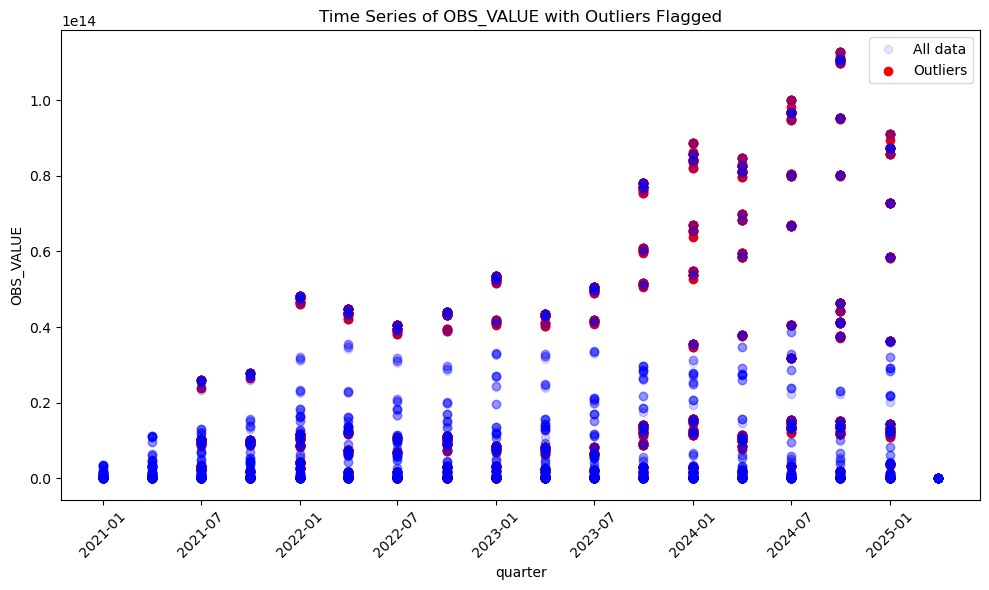

In [14]:
#based on random forest outliers

pdf_out = b.toPandas()
pdf_outliers = pdf_out[pdf_out['is_outlier'] == True]
plt.figure(figsize=(10, 6))

plt.plot(
    pdf_out['parsed_date'],
    pdf_out['OBS_VALUE'],
    marker='o',
    linestyle='',
    color='blue',
    alpha=0.1,
    label='All data'
)

plt.scatter(
    pdf_outliers['parsed_date'],
    pdf_outliers['OBS_VALUE'],
    color='red',
    label='Outliers'
)

plt.xlabel('quarter')
plt.ylabel('OBS_VALUE')
plt.title('Time Series of OBS_VALUE with Outliers Flagged')
plt.legend()

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [15]:
pdf_out

,KEY,TITLE,TITLE_COMPL,PROSP3_MEASURE,FREQ,S_NCA,PROSP3_SECURITIES_TYPE,MTR,CURR_ISSNC,PROSP3_OFFER_TYPE,...,MV,GROUP,TIME_PERIOD,PK,OBS_VALUE,parsed_date,PROSP3_SME_CAT_TYPE,SEC_TYPE_CFI,OBS_VALUE_4sd,is_outlier
0,PROSP3.MV.Q.NL.Z.Z.Z.Z.Z.EL.Z.ZALL.Z.Z.Z.Z.Z.Z,Quarterly consideration offered of filed Limit...,NaN,[MV] Consideration offer in EUR,[Q] quarterly,[NL] Netherlands,Z,Z,Z,Z,...,Z,PROSP3.MV.Q.Y.Z.Z.Z.Z.Z.Y.Z.Y.Z.Z.Z.Z.Z.Z,2021-Q3,1.718157e+10,7500000.0,2021-07-01,Z,[EL] Limited partnership units,False,False
1,PROSP3.NUM_INSTR.Q.A6.Z.Z.Z.Z.Z.EL.Z.Z.Z.Z.Z.Z...,Quarterly number of filed Limited partnership ...,NaN,[NUM_INSTR] Number of instruments,[Q] quarterly,[A6] EEA30,Z,Z,Z,Z,...,Z,PROSP3.NUM_INSTR.Q.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z.Z,2021-Q3,7.559190e+11,1.0,2021-07-01,Z,[EL] Limited partnership units,False,False
2,PROSP3.NUM_ISSUER.Q.A1.Z.Z.Z.Z.Z.EL.NL.Z.Z.Z.Z...,Quarterly number of issuers of Limited partner...,NaN,[NUM_ISSUER] Number of unique issuers in secur...,[Q] quarterly,[A1] World,Z,Z,Z,Z,...,Z,PROSP3.NUM_ISSUER.Q.Y.Z.Z.Z.Z.Z.Y.Y.Z.Z.Z.Z.Z.Z.Z,2021-Q3,2.405260e+11,1.0,2021-07-01,Z,[EL] Limited partnership units,False,False
3,PROSP3.NUM_INSTR.Q.NL.Z.Z.Z.Z.Z.EL.Z.Z.Z.Z.Z.Z...,Quarterly number of filed Limited partnership ...,NaN,[NUM_INSTR] Number of instruments,[Q] quarterly,[NL] Netherlands,Z,Z,Z,Z,...,Z,PROSP3.NUM_INSTR.Q.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z.Z,2021-Q3,7.559190e+11,1.0,2021-07-01,Z,[EL] Limited partnership units,False,False
4,PROSP3.MV.Q.A6.Z.Z.Z.Z.Z.EL.Z.Z.Z.Z.Z.Z.Z.Z,Quarterly consideration offered of filed Limit...,NaN,[MV] Consideration offer in EUR,[Q] quarterly,[A6] EEA30,Z,Z,Z,Z,...,Z,PROSP3.MV.Q.Y.Z.Z.Z.Z.Z.Y.Z.Z.Z.Z.Z.Z.Z.Z,2021-Q3,6.786070e+11,7500000.0,2021-07-01,Z,[EL] Limited partnership units,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
152023,PROSP3.NUM_ISSUER.Q.SE.Z.Z.Z.Z.Z.CP.A1.Z.Z.Z.Z...,Quarterly number of issuers of PEs from World ...,NaN,[NUM_ISSUER] Number of unique issuers in secur...,[Q] quarterly,[SE] Sweden,Z,Z,Z,Z,...,Z,PROSP3.NUM_ISSUER.Q.Y.Z.Z.Z.Z.Z.Y.Y.Z.Z.Z.Z.Z.Z.Z,2023-Q2,2.491160e+11,1.0,2023-04-01,Z,[CP] PEs,False,False
152024,PROSP3.NUM_ISSUER.Q.A6.Z.Z.Z.Z.Z.CP.A6.Z.Z.Z.Z...,Quarterly number of issuers of PEs from EEA30 ...,NaN,[NUM_ISSUER] Number of unique issuers in secur...,[Q] quarterly,[A6] EEA30,Z,Z,Z,Z,...,Z,PROSP3.NUM_ISSUER.Q.Y.Z.Z.Z.Z.Z.Y.Y.Z.Z.Z.Z.Z.Z.Z,2021-Q2,7.387390e+11,1.0,2021-04-01,Z,[CP] PEs,False,False
152025,PROSP3.NUM_ISSUER.Q.A6.Z.Z.Z.Z.Z.CP.A6.Z.Z.Z.Z...,Quarterly number of issuers of PEs from EEA30 ...,NaN,[NUM_ISSUER] Number of unique issuers in secur...,[Q] quarterly,[A6] EEA30,Z,Z,Z,Z,...,Z,PROSP3.NUM_ISSUER.Q.Y.Z.Z.Z.Z.Z.Y.Y.Z.Z.Z.Z.Z.Z.Z,2023-Q1,3.865550e+11,1.0,2023-01-01,Z,[CP] PEs,False,False
152026,PROSP3.NUM_ISSUER.Q.I8.Z.Z.Z.Z.Z.CP.A1.Z.Z.Z.Z...,Quarterly number of issuers of PEs from World ...,NaN,[NUM_ISSUER] Number of unique issuers in secur...,[Q] quarterly,[I8] EA19,Z,Z,Z,Z,...,Z,PROSP3.NUM_ISSUER.Q.Y.Z.Z.Z.Z.Z.Y.Y.Z.Z.Z.Z.Z.Z.Z,2021-Q2,7.387390e+11,1.0,2021-04-01,Z,[CP] PEs,False,False


In [19]:
import numpy as np
pdf_out = pdf_out.copy()
pdf_out['Status'] = np.where(pdf_out['is_outlier'], 'Outlier', 'Normal')

pdf_clean = pdf_out.loc[:, ~pdf_out.columns.duplicated()].copy()

# 1) Create the Status column
import numpy as np
pdf_clean['Status'] = np.where(pdf_clean['is_outlier'], 'Outlier', 'Normal')


eplot = epy.esmaplotly()
fig = eplot.scatter(
    pdf_clean,
    x='parsed_date',
    y='OBS_VALUE',
    color='Status'
)

# 2) remap groups to ESMA colours & symbols
for trace in fig.data:
    if trace.name == 'Outlier':
        trace.marker.color  = '#DB5700'
        trace.marker.symbol = 'circle-open'
        trace.marker.size   = 13
    else:  # Normal
        trace.marker.color  = '#007EFF'
        trace.marker.symbol = 'circle'
        trace.marker.size   = 12

# 3) add light-grey gridlines on both axes
fig.update_xaxes(
    showgrid=True, gridcolor='rgba(200,200,200,0.3)', gridwidth=1,
    tickfont=dict(size=14), title_font=dict(size=15)
)
fig.update_yaxes(
    showgrid=True, gridcolor='rgba(200,200,200,0.3)', gridwidth=1,
    tickfont=dict(size=14), title_font=dict(size=15)
)

# 4) layout tweaks (transparent background etc.)
fig.update_layout(
    title="Threshold Outliers",
    font=dict(size=15),
    legend=dict(font=dict(size=15)),
    width=1000, height=600,
    margin=dict(l=60, r=40, t=60, b=100),
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)'
)

# 5) ESMA footer annotation
fig.add_annotation(
    dict(
        text="Note: Scatterplot differentiating outliers and typical datapoints, generated by Thresholds",
        xref="paper", yref="paper", x=0, y=-0.15,
        showarrow=False, font=dict(size=12), align="left"
    )
)

# 6) save & show
fig.write_image('thr_scatter.png', width=1000, height=600, scale=2, engine='kaleido')
fig.show()

In [15]:
a.show(10)

+--------------------+--------------------+-----------+--------------------+-------------+---------+----------------------+---+----------+-----------------+--------------------+------------+----------+------------------+----------------+-------------------+-----------+------------+-----------+---+--------------------+-----------+----------+------------+-----------+--------------+-------------------+----------+
|                 KEY|               TITLE|TITLE_COMPL|      PROSP3_MEASURE|         FREQ|    S_NCA|PROSP3_SECURITIES_TYPE|MTR|CURR_ISSNC|PROSP3_OFFER_TYPE|PROSP3_DOCUMENT_TYPE|SEC_TYPE_CFI|ISSUER_COU|     ISSUER_SECTOR|PROSP3_PRSP_TYPE|PROSP3_SME_CAT_TYPE|PROSP3_PSSP|PROSP3_VENUE|PROSP3_LNGG| MV|               GROUP|TIME_PERIOD|        PK|   OBS_VALUE|parsed_date|      pred_rfr|       residual_rfr|is_outlier|
+--------------------+--------------------+-----------+--------------------+-------------+---------+----------------------+---+----------+-----------------+----------------

25/05/21 13:57:07 WARN TaskSetManager: Stage 95 contains a task of very large size (5016 KiB). The maximum recommended task size is 1000 KiB.


### 6. Trying the model with a lag predictor in the feature cols

In [16]:
# 1) parse your quarter into a real date
parse_q = f.expr("""
  to_date(
    concat(
      split(TIME_PERIOD, '-Q')[0],
      '-',
      (cast(split(TIME_PERIOD, '-Q')[1] as int)-1)*3+1,
      '-01'
    )
  )
""")

df2 = df_joined \
  .withColumn('parsed_date', parse_q)

# 2) define a window per country+CFI, ordered by date
w = Window.partitionBy('S_NCA','SEC_TYPE_CFI') \
          .orderBy('parsed_date')

# 3) add one‑quarter lag
df2 = df2.withColumn('lag1_obs', f.lag('OBS_VALUE').over(w))

# 4) add a numeric time feature
df2 = df2.withColumn('time_index',
    f.year('parsed_date')*10 + ((f.quarter('parsed_date')-1))
)

# drop the first row per group (where lag1_obs is null)
df2 = df2.filter(f.col('lag1_obs').isNotNull())

In [17]:
e = melisa_outliers(
    spark_df    = df2,
    mode        = 'random_forest_regressor',
    numbercol   = 'OBS_VALUE',
    groupbycols = ['S_NCA','SEC_TYPE_CFI'],
    showstats   = True,
    min_filter  = 0,
    feature_cols= ['lag1_obs','time_index']
)

25/05/21 13:57:07 WARN TaskSetManager: Stage 97 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.
/var/folders/v1/v83gn92x7vv8phs46b_nj2gr0000gn/T/ipykernel_37342/4049780684.py:61: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(process_group)


is_outlier
False    149525
True       1803
Name: count, dtype: int64


25/05/21 13:57:43 WARN TaskSetManager: Stage 106 contains a task of very large size (5223 KiB). The maximum recommended task size is 1000 KiB.


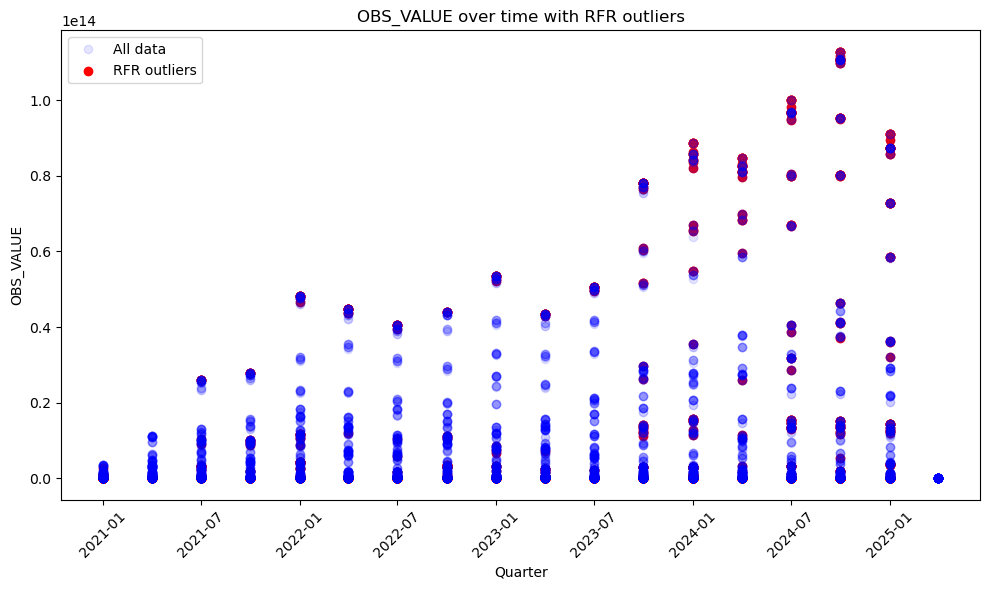

In [19]:
## Graph RF results with a lag.

pdf = e.select('parsed_date','OBS_VALUE','is_outlier').toPandas()
pdf_out = pdf  # alias for clarity
pdf_outliers = pdf[pdf['is_outlier'] == True]

plt.figure(figsize=(10, 6))

# all data as marker-only points
plt.plot(
    pdf_out['parsed_date'],
    pdf_out['OBS_VALUE'],
    marker='o',
    linestyle='',
    color='blue',
    alpha=0.1,
    label='All data'
)

# outliers overlaid in red
plt.scatter(
    pdf_outliers['parsed_date'],
    pdf_outliers['OBS_VALUE'],
    color='red',
    label='RFR outliers'
)

plt.xlabel('Quarter')
plt.ylabel('OBS_VALUE')
plt.title('OBS_VALUE over time with RFR outliers')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [20]:
# Select only the columns you need
pdf = (
    e
    .select('KEY','TIME_PERIOD', 'S_NCA', 'SEC_TYPE_CFI',
            'OBS_VALUE','parsed_date', 'is_outlier')
    .toPandas()
)

25/05/21 13:57:45 WARN TaskSetManager: Stage 107 contains a task of very large size (5223 KiB). The maximum recommended task size is 1000 KiB.


In [21]:
pdf['S_NCA'].value_counts()

S_NCA
[A6] EEA30             16682
[A1] World             16682
[V5] EU27              16176
[I8] EA19              14422
[LU] Luxembourg         8950
[IE] Ireland            7992
[K0] EU not in EA19     7283
[DE] Germany            6021
[SE] Sweden             5352
[FR] France             4707
[A0] EEA3               3989
[NL] Netherlands        3956
[AT] Austria            3924
[IT] Italy              2800
[NO] Norway             2600
[ES] Spain              2392
[BE] Belgium            2316
[LI] Liechtenstein      2260
[CZ] Czechia            2007
[PL] Poland             1877
[SK] Slovakia           1859
[BG] Bulgaria           1747
[DK] Denmark            1736
[FI] Finland            1643
[IS] Iceland            1495
[MT] Malta              1414
[GR] Greece             1373
[LV] Latvia             1321
[RO] Romania            1261
[PT] Portugal           1246
[HU] Hungary             919
[EE] Estonia             885
[HR] Croatia             746
[LT] Lithuania           666
[SI] Slo

In [22]:
pdf[(pdf['S_NCA'] == '[DE] Germany') & (pdf['is_outlier'] == True)].groupby('SEC_TYPE_CFI')['is_outlier'].sum().loc[lambda s: s>0]

SEC_TYPE_CFI
Z                                                9
[DE] Structured debt (no capital protection)     6
[DM] Other debt                                  3
[DS] Structured debt (capital protection)        1
[DT] MTN                                         2
[D] Debt                                         2
[ES] Shares                                      3
[EY] Structured instruments (participation)      3
[E] Equity                                       6
[RF] Mini-future certificates                    3
[RW] Warrants                                    3
[R] Entitlement (rights)                        11
[SCRT] Securities                                5
[ZALL] All records if applicable                 5
[ZNAV] CFI not available                         3
Name: is_outlier, dtype: int64

In [23]:
sub = pdf[
    (pdf['S_NCA']   == '[DE] Germany') &
    (pdf['SEC_TYPE_CFI'] == '[DM] Other debt')
]

In [24]:
sub

,KEY,TIME_PERIOD,S_NCA,SEC_TYPE_CFI,OBS_VALUE,parsed_date,is_outlier
97741,PROSP3.NUM_INSTR.Q.DE.Z.Z.Z.Z.Z.DM.Z.S12.Z.Z.Z...,2021-Q1,[DE] Germany,[DM] Other debt,14.0,2021-01-01,False
97742,PROSP3.NUM_INSTR.Q.DE.Z.Z.Z.Z.Z.DM.Z.ZALL.Z.Z....,2021-Q1,[DE] Germany,[DM] Other debt,14.0,2021-01-01,False
97743,PROSP3.NUM_ISSUER.Q.DE.Z.Z.Z.Z.Z.DM.A1_Z.Z.Z.Z...,2021-Q1,[DE] Germany,[DM] Other debt,1.0,2021-01-01,False
97744,PROSP3.NUM_ISSUER.Q.DE.Z.Z.Z.Z.Z.DM.A6.Z.Z.Z.Z...,2021-Q2,[DE] Germany,[DM] Other debt,3.0,2021-04-01,False
97745,PROSP3.NUM_ISSUER.Q.DE.Z.Z.Z.Z.Z.DM.DE.Z.Z.Z.Z...,2021-Q2,[DE] Germany,[DM] Other debt,3.0,2021-04-01,False
...,...,...,...,...,...,...,...
97940,PROSP3.MV.Q.DE.Z.Z.Z.Z.Z.DM.Z.S11.Z.Z.Z.Z.Z.Z,2025-Q1,[DE] Germany,[DM] Other debt,57357036.0,2025-01-01,False
97941,PROSP3.NUM_INSTR.Q.DE.Z.Z.Z.Z.Z.DM.Z.S12.Z.Z.Z...,2025-Q1,[DE] Germany,[DM] Other debt,21.0,2025-01-01,False
97942,PROSP3.NUM_ISSUER.Q.DE.Z.Z.Z.Z.Z.DM.A1.Z.Z.Z.Z...,2025-Q1,[DE] Germany,[DM] Other debt,2.0,2025-01-01,False
97943,PROSP3.NUM_INSTR.Q.DE.Z.Z.Z.Z.Z.DM.Z.S11.Z.Z.Z...,2025-Q1,[DE] Germany,[DM] Other debt,8.0,2025-01-01,False


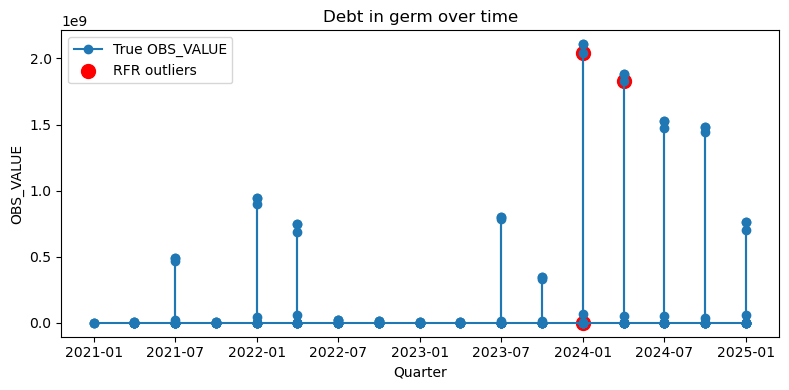

In [26]:
#Plotting outliers for feature specific.

plt.figure(figsize=(8,4))
plt.plot(
    sub['parsed_date'],
    sub['OBS_VALUE'],
    '-o',
    label='True OBS_VALUE'
)

out = sub[sub['is_outlier']]
plt.scatter(
    out['parsed_date'],
    out['OBS_VALUE'],
    s=100,
    color='red',
    label='RFR outliers'
)

plt.title("Debt in germ over time")
plt.xlabel("Quarter")
plt.ylabel("OBS_VALUE")
plt.legend()
plt.tight_layout()
plt.show()

### 7. Adding country Mappings

In [27]:
mapping_df = pd.read_excel('Country Mapping.xlsx')


In [28]:
mapping_df

,CODE,DIRECT_PARENT,LEVEL_PARENT,ORDER,CODE_DESCRIPTION
0,Z,NaN,0,NaN,Filter not applied for location
1,ZNAV,Z,1,NaN,Country not available
2,A1,Z,1,NaN,World
3,A1_Z,A1,2,NaN,World - Undetermined
4,A1_TRNS,A1,2,NaN,World - International organisation
...,...,...,...,...,...
292,EH,UN015,5,NaN,Western Sahara
293,YE,UN202,5,NaN,Yemen
294,ZM,UN202,5,NaN,Zambia
295,ZW,UN202,5,NaN,Zimbabwe


In [29]:
parent_map = dict(
    zip(
        mapping_df['CODE'],
        mapping_df['DIRECT_PARENT']
    )
)

In [30]:
pdf

,KEY,TIME_PERIOD,S_NCA,SEC_TYPE_CFI,OBS_VALUE,parsed_date,is_outlier
0,PROSP3.NUM_INSTR.Q.A0.Z.Z.Z.Z.Z.ED.Z.Z.Z.Z.Z.Z...,2023-Q3,[A0] EEA3,[ED] DR equities,1.0,2023-07-01,False
1,PROSP3.NUM_INSTR.Q.A0.Z.Z.Z.Z.Z.ED.Z.ZNAV.Z.Z....,2023-Q3,[A0] EEA3,[ED] DR equities,1.0,2023-07-01,False
2,PROSP3.NUM_ISSUER.Q.A0.Z.Z.Z.Z.Z.ED.ROW.Z.Z.Z....,2023-Q3,[A0] EEA3,[ED] DR equities,1.0,2023-07-01,False
3,PROSP3.MV.Q.A0.Z.Z.Z.Z.Z.ED.Z.Z.Z.Z.Z.Z.Z.Z,2023-Q3,[A0] EEA3,[ED] DR equities,1834864.6,2023-07-01,False
4,PROSP3.NUM_ISSUER.Q.A0.Z.Z.Z.Z.Z.ED.UN019.Z.Z....,2023-Q3,[A0] EEA3,[ED] DR equities,1.0,2023-07-01,False
...,...,...,...,...,...,...,...
151323,PROSP3.NUM_ISSUER.Q.V5.Z.Z.Z.Z.Z.ZALL.ROW.Z.Z....,2025-Q2,[V5] EU27,[ZALL] All records if applicable,1.0,2025-04-01,False
151324,PROSP3.NUM_INSTR.Q.V5.Z.Z.Z.Z.Z.ZALL.Z.Z.Z.Z.Z...,2025-Q2,[V5] EU27,[ZALL] All records if applicable,24.0,2025-04-01,False
151325,PROSP3.NUM_INSTR.Q.V5.Z.Z.Z.Z.Z.ZALL.Z.ZALL.Z....,2025-Q2,[V5] EU27,[ZALL] All records if applicable,24.0,2025-04-01,False
151326,PROSP3.NUM_ISSUER.Q.V5.Z.Z.Z.Z.Z.ZALL.A1.Z.Z.Z...,2025-Q2,[V5] EU27,[ZALL] All records if applicable,4.0,2025-04-01,False


### 8. Flagging up one parent.

In [32]:
# 3) Extract the raw code from S_NCA
pdf['code'] = pdf['S_NCA'].str.extract(r'\[([^\]]+)\]')

# 4) Flagged rows = those your RF already marked
flagged = pdf.loc[
    pdf['is_outlier'],
    ['TIME_PERIOD','SEC_TYPE_CFI','code']
].copy()

# 5) Map each code to its *immediate* parent
flagged['ancestor_code'] = flagged['code'].map(parent_map)

# 6) Drop any that didn’t have a parent
flagged_expanded = flagged.dropna(subset=['ancestor_code'])

# 7) Create an inherited-flag on the original pdf
pdf['inherited_outlier'] = False

mask = pd.merge(
    pdf,
    flagged_expanded[['TIME_PERIOD','SEC_TYPE_CFI','ancestor_code']],
    left_on  = ['TIME_PERIOD','SEC_TYPE_CFI','code'],
    right_on = ['TIME_PERIOD','SEC_TYPE_CFI','ancestor_code'],
    how      = 'left',
    indicator = '_hit'
)['_hit'] == 'both'

pdf.loc[mask, 'inherited_outlier'] = True

# 8) Inspect
print(
    pdf[[
        'KEY','TIME_PERIOD','S_NCA','SEC_TYPE_CFI',
        'OBS_VALUE','is_outlier','inherited_outlier'
    ]].head(10)
)

                                                 KEY TIME_PERIOD      S_NCA  \
0  PROSP3.NUM_INSTR.Q.A0.Z.Z.Z.Z.Z.ED.Z.Z.Z.Z.Z.Z...     2023-Q3  [A0] EEA3   
1  PROSP3.NUM_INSTR.Q.A0.Z.Z.Z.Z.Z.ED.Z.ZNAV.Z.Z....     2023-Q3  [A0] EEA3   
2  PROSP3.NUM_ISSUER.Q.A0.Z.Z.Z.Z.Z.ED.ROW.Z.Z.Z....     2023-Q3  [A0] EEA3   
3        PROSP3.MV.Q.A0.Z.Z.Z.Z.Z.ED.Z.Z.Z.Z.Z.Z.Z.Z     2023-Q3  [A0] EEA3   
4  PROSP3.NUM_ISSUER.Q.A0.Z.Z.Z.Z.Z.ED.UN019.Z.Z....     2023-Q3  [A0] EEA3   
5     PROSP3.MV.Q.A0.Z.Z.Z.Z.Z.ED.Z.ZNAV.Z.Z.Z.Z.Z.Z     2023-Q3  [A0] EEA3   
6  PROSP3.NUM_ISSUER.Q.A0.Z.Z.Z.Z.Z.ED.A1.Z.Z.Z.Z...     2024-Q1  [A0] EEA3   
7  PROSP3.NUM_INSTR.Q.A0.Z.Z.Z.Z.Z.ED.Z.Z.Z.Z.Z.Z...     2024-Q1  [A0] EEA3   
8  PROSP3.NUM_INSTR.Q.A0.Z.Z.Z.Z.Z.ED.Z.ZNAV.Z.Z....     2024-Q1  [A0] EEA3   
9  PROSP3.NUM_ISSUER.Q.A0.Z.Z.Z.Z.Z.ED.ROW.Z.Z.Z....     2024-Q1  [A0] EEA3   

       SEC_TYPE_CFI  OBS_VALUE  is_outlier  inherited_outlier  
0  [ED] DR equities        1.0       False              False  
1 

In [33]:
pdf[pdf['inherited_outlier']==True]

,KEY,TIME_PERIOD,S_NCA,SEC_TYPE_CFI,OBS_VALUE,parsed_date,is_outlier,code,inherited_outlier
448,PROSP3.NUM_ISSUER.Q.A1.Z.Z.Z.Z.Z.Z.CH.Z.Z.Z.Z....,2021-Q3,[A1] World,Z,7.0,2021-07-01,False,A1,True
449,PROSP3.NUM_ISSUER.Q.A1.Z.Z.Z.Z.Z.Z.CZ.Z.Z.Z.Z....,2021-Q3,[A1] World,Z,21.0,2021-07-01,False,A1,True
450,PROSP3.NUM_ISSUER.Q.A1.Z.Z.Z.Z.Z.Z.E2.Z.Z.Z.Z....,2021-Q3,[A1] World,Z,42.0,2021-07-01,False,A1,True
451,PROSP3.NUM_ISSUER.Q.A1.Z.Z.Z.Z.Z.Z.HR.Z.Z.Z.Z....,2021-Q3,[A1] World,Z,3.0,2021-07-01,False,A1,True
452,PROSP3.NUM_ISSUER.Q.A1.Z.Z.Z.Z.Z.Z.SE.Z.Z.Z.Z....,2021-Q3,[A1] World,Z,92.0,2021-07-01,False,A1,True
...,...,...,...,...,...,...,...,...,...
151191,PROSP3.NUM_ISSUER.Q.V5.Z.Z.Z.Z.Z.ZALL.UN019.Z....,2024-Q3,[V5] EU27,[ZALL] All records if applicable,10.0,2024-07-01,False,V5,True
151192,PROSP3.NUM_ISSUER.Q.V5.Z.Z.Z.Z.Z.ZALL.BE.Z.Z.Z...,2024-Q3,[V5] EU27,[ZALL] All records if applicable,10.0,2024-07-01,True,V5,True
151193,PROSP3.NUM_ISSUER.Q.V5.Z.Z.Z.Z.Z.ZALL.GB.Z.Z.Z...,2024-Q3,[V5] EU27,[ZALL] All records if applicable,14.0,2024-07-01,True,V5,True
151194,PROSP3.NUM_ISSUER.Q.V5.Z.Z.Z.Z.Z.ZALL.ROW.Z.Z....,2024-Q3,[V5] EU27,[ZALL] All records if applicable,49.0,2024-07-01,False,V5,True


Ask Jordi abt the further granularity data to perform the actual time series analysis.

### 9. RF with further stat features

In [34]:
stats = df2.groupBy('S_NCA','SEC_TYPE_CFI').agg(
    f.expr("percentile_approx(OBS_VALUE, 0.5)").alias("median"),
    f.stddev("OBS_VALUE").alias("stddev")
)

In [48]:
df_thresh = (
  df2
    .join(stats, on=['S_NCA','SEC_TYPE_CFI'], how='left')
    .withColumn(
      'is_outlier_4sd',
      f.abs(f.col('OBS_VALUE') - f.col('median')) > 4 * f.col('stddev')
    )
    .withColumn(
      'is_outlier_4sd',
      f.abs(f.col('OBS_VALUE') - f.col('median')) > 4 * f.col('stddev')
    )
)

In [49]:
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.regression import RandomForestRegressor
from pyspark.ml import Pipeline

In [50]:
from pyspark.sql.types import DoubleType
df2 = df2.withColumn("OBS_VALUE", df2["OBS_VALUE"].cast(DoubleType()))
df2 = df2.withColumn("lag1_obs", df2["lag1_obs"].cast(DoubleType()))

In [51]:
df2.show(10)

25/05/21 14:00:00 WARN TaskSetManager: Stage 518 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.


+--------------------+--------------------+-----------+--------------------+-------------+---------+----------------------+---+----------+-----------------+--------------------+----------------+----------------+--------------------+----------------+-------------------+-----------+------------+-----------+---+--------------------+-----------+---------------+---------+-----------+---------+----------+
|                 KEY|               TITLE|TITLE_COMPL|      PROSP3_MEASURE|         FREQ|    S_NCA|PROSP3_SECURITIES_TYPE|MTR|CURR_ISSNC|PROSP3_OFFER_TYPE|PROSP3_DOCUMENT_TYPE|    SEC_TYPE_CFI|      ISSUER_COU|       ISSUER_SECTOR|PROSP3_PRSP_TYPE|PROSP3_SME_CAT_TYPE|PROSP3_PSSP|PROSP3_VENUE|PROSP3_LNGG| MV|               GROUP|TIME_PERIOD|             PK|OBS_VALUE|parsed_date| lag1_obs|time_index|
+--------------------+--------------------+-----------+--------------------+-------------+---------+----------------------+---+----------+-----------------+--------------------+----------------+

In [52]:
assembler = VectorAssembler(
  inputCols=['lag1_obs','time_index'],
  outputCol='features'
)

In [53]:
# it gave an error before, be careful with the version of RANDOM FOREST REGRESSOR
# you import bcs if u use the one from sklearn, it will not work, use the one
# from pyspark.

rf = RandomForestRegressor(
    featuresCol="features",
    labelCol="OBS_VALUE",
    predictionCol="prediction",
    numTrees=100
)

# 3) build and fit the pipeline
pipeline = Pipeline(stages=[assembler, rf])
model = pipeline.fit(df2)

# 4) make predictions
predictions = model.transform(df2)
predictions.select("OBS_VALUE", "prediction").show(20)

25/05/21 14:00:13 WARN TaskSetManager: Stage 527 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.
25/05/21 14:00:23 WARN TaskSetManager: Stage 570 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.


+---------+--------------------+
|OBS_VALUE|          prediction|
+---------+--------------------+
|     25.0| 7.00974702217237E10|
|      1.0| 7.00974702217237E10|
|      1.0|6.175929526823321...|
|      1.0|6.175929526823321...|
|      1.0|6.175929526823321...|
|     24.0|6.175929526823321...|
|      1.0| 7.00974702217237E10|
|      5.0|6.175929526823321...|
|      3.0|6.649219630484309E10|
|     24.0| 6.26464322451271E10|
|      1.0| 7.00974702217237E10|
|      1.0|6.175929526823321...|
|     15.0|6.175929526823321...|
|      4.0| 7.00974702217237E10|
|      3.0|6.405586281102704E10|
|      1.0| 6.26464322451271E10|
|      1.0|6.175929526823321...|
|      1.0|6.175929526823321...|
|     14.0|6.175929526823321...|
|      1.0| 7.00974702217237E10|
+---------+--------------------+
only showing top 20 rows



In [41]:
## keep pandas , param , ml package --> different model

In [55]:
from pyspark.ml import Pipeline
from pyspark.ml.feature import (
    VectorAssembler,
    StringIndexer,
    OneHotEncoder
)
from pyspark.ml.classification import RandomForestClassifier
from pyspark.ml.evaluation import BinaryClassificationEvaluator
import pyspark.sql.functions as F
from pyspark.sql.types import DoubleType

# 0) Prepare your features + label
df_clf = (
    df2
    # join your stats as before...
    .join(stats, on=['S_NCA','SEC_TYPE_CFI'])
    .withColumn(
        'is_outlier_4sd',
        (F.abs(F.col('OBS_VALUE') - F.col('median')) > 4 * F.col('stddev'))
          .cast(DoubleType())
    )
    .withColumn('lag1_obs', F.coalesce('lag1_obs', F.lit(0.0)))
)

# 1) Categorical indexing + one-hot
si_nca = StringIndexer(inputCol='S_NCA',        outputCol='S_NCA_idx')
si_cfi = StringIndexer(inputCol='SEC_TYPE_CFI', outputCol='CFI_idx')

ohe_nca = OneHotEncoder(inputCol='S_NCA_idx', outputCol='S_NCA_vec')
ohe_cfi = OneHotEncoder(inputCol='CFI_idx',   outputCol='CFI_vec')

# 2) Assemble feature vector
feat_cols = [
    'lag1_obs', 'time_index',
    'median', 'stddev',
    'S_NCA_vec', 'CFI_vec'
]
assembler = VectorAssembler(inputCols=feat_cols, outputCol='features')

# 3) RandomForestClassifier
rf_clf = RandomForestClassifier(
    featuresCol='features',
    labelCol='is_outlier_4sd',
    predictionCol='pred',
    probabilityCol='prob',
    numTrees=100,
    maxDepth=5
)

# 4) Build the pipeline
pipeline = Pipeline(stages=[
    si_nca, si_cfi, ohe_nca, ohe_cfi,
    assembler, rf_clf
])

# 5) Train/test split
train, test = df_clf.randomSplit([0.8,0.2], seed=42)
model       = pipeline.fit(train)
preds       = model.transform(test)

# 6) Evaluate with AUC
evaluator = BinaryClassificationEvaluator(
    labelCol='is_outlier_4sd',
    rawPredictionCol='prob',
    metricName='areaUnderROC'
)
auc = evaluator.evaluate(preds)
print(f"Test AUC = {auc:.3f}")

# 7) Confusion matrix
cm = (
    preds
    .groupBy('is_outlier_4sd', 'pred')
    .count()
    .orderBy('is_outlier_4sd','pred')
)
cm.show()

25/05/21 14:00:48 WARN TaskSetManager: Stage 629 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.
25/05/21 14:00:49 WARN TaskSetManager: Stage 631 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.
25/05/21 14:00:50 WARN TaskSetManager: Stage 654 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.
25/05/21 14:00:50 WARN TaskSetManager: Stage 656 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.
25/05/21 14:00:51 WARN TaskSetManager: Stage 679 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.
25/05/21 14:00:52 WARN TaskSetManager: Stage 681 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.
25/05/21 14:00:52 WARN TaskSetManager: Stage 689 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.

Test AUC = 0.571


25/05/21 14:01:02 WARN TaskSetManager: Stage 853 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.


+--------------+----+-----+
|is_outlier_4sd|pred|count|
+--------------+----+-----+
|           0.0| 0.0|29579|
|           1.0| 0.0|  544|
+--------------+----+-----+



In [58]:
preds.show(10)

25/05/21 14:15:13 WARN TaskSetManager: Stage 893 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.
25/05/21 14:15:14 WARN TaskSetManager: Stage 895 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.


+----------+----------------+--------------------+--------------------+-----------+--------------------+-------------+----------------------+---+----------+-----------------+--------------------+----------+--------------------+----------------+-------------------+-----------+------------+-----------+---+--------------------+-----------+---------------+-------------+-----------+---------+----------+------+--------------------+--------------+---------+-------+---------------+---------------+--------------------+--------------------+--------------------+----+
|     S_NCA|    SEC_TYPE_CFI|                 KEY|               TITLE|TITLE_COMPL|      PROSP3_MEASURE|         FREQ|PROSP3_SECURITIES_TYPE|MTR|CURR_ISSNC|PROSP3_OFFER_TYPE|PROSP3_DOCUMENT_TYPE|ISSUER_COU|       ISSUER_SECTOR|PROSP3_PRSP_TYPE|PROSP3_SME_CAT_TYPE|PROSP3_PSSP|PROSP3_VENUE|PROSP3_LNGG| MV|               GROUP|TIME_PERIOD|             PK|    OBS_VALUE|parsed_date| lag1_obs|time_index|median|              stddev|is_outli

I can also make the assign direct parent a function.

25/05/21 14:15:29 WARN TaskSetManager: Stage 927 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.
25/05/21 14:15:29 WARN TaskSetManager: Stage 929 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.


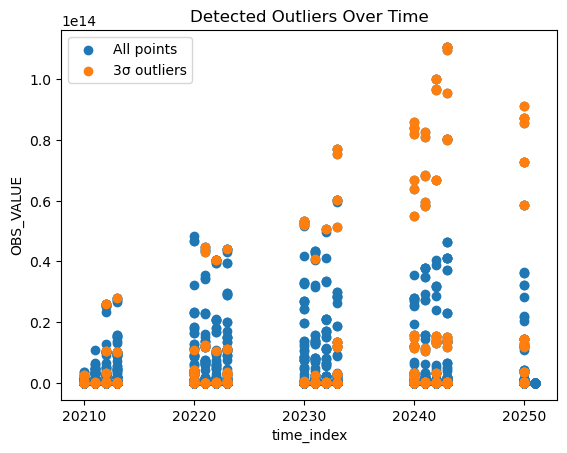

In [61]:
import matplotlib.pyplot as plt

# Convert your Spark predictions to Pandas
pdf = preds.select('time_index', 'OBS_VALUE', 'is_outlier_4sd').toPandas()

# Plot all observations
plt.figure()
plt.scatter(pdf['time_index'], pdf['OBS_VALUE'], label='All points')

# Highlight the outliers
outliers = pdf[pdf['is_outlier_4sd'] == 1.0]
plt.scatter(outliers['time_index'], outliers['OBS_VALUE'], label='3σ outliers')

plt.xlabel('time_index')
plt.ylabel('OBS_VALUE')
plt.title('Detected Outliers Over Time')
plt.legend()
plt.show()

In [62]:
pdf.head(10)

,time_index,OBS_VALUE,is_outlier_4sd
0,20232,1.834865e+06,0.0
1,20232,1.000000e+00,0.0
2,20240,1.000000e+00,0.0
3,20210,3.500794e+12,0.0
4,20222,4.048987e+13,1.0
5,20232,5.067352e+13,1.0
6,20250,9.110055e+13,1.0
7,20220,1.856984e+06,0.0
8,20242,2.037958e+06,0.0
9,20243,1.988228e+06,0.0


In [64]:
import pandas as pd
import plotly.express as px

# 1) Convert your Spark predictions to pandas
pdf = preds.select(
    'parsed_date', 'OBS_VALUE', 'is_outlier_4sd', 'S_NCA', 'SEC_TYPE_CFI'
).toPandas()

# 2) Prepare the data
pdf['parsed_date'] = pd.to_datetime(pdf['parsed_date'])
pdf['Status'] = pdf['is_outlier_4sd'].map({0.0: 'Normal', 1.0: '4σ Outlier'})

# 3) Create the interactive scatter
fig = px.scatter(
    pdf,
    x='parsed_date',
    y='OBS_VALUE',
    color='Status',
    color_discrete_map={'Normal': 'blue', '4σ Outlier': 'red'},
    hover_data=['OBS_VALUE', 'S_NCA', 'SEC_TYPE_CFI'],
    title='OBS_VALUE Time Series with 4σ Outliers Highlighted',
    opacity=0.7
)

fig.update_layout(
    xaxis_title='Quarter',
    yaxis_title='OBS_VALUE',
    legend_title='Point Type'
)

fig.show()

25/05/21 14:15:41 WARN TaskSetManager: Stage 944 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.
25/05/21 14:15:41 WARN TaskSetManager: Stage 946 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.


In [72]:
pdf

,parsed_date,OBS_VALUE,is_outlier_4sd,S_NCA,SEC_TYPE_CFI,Status
0,2023-07-01,1.834865e+06,0.0,[A0] EEA3,[ED] DR equities,Normal
1,2023-07-01,1.000000e+00,0.0,[A0] EEA3,[ED] DR equities,Normal
2,2024-01-01,1.000000e+00,0.0,[A0] EEA3,[ED] DR equities,Normal
3,2021-01-01,3.500794e+12,0.0,[A1] World,Z,Normal
4,2022-07-01,4.048987e+13,1.0,[A1] World,Z,4σ Outlier
...,...,...,...,...,...,...
30118,2023-10-01,7.000000e+00,0.0,[V5] EU27,[ZALL] All records if applicable,Normal
30119,2021-04-01,6.260000e+02,0.0,[V5] EU27,[ZALL] All records if applicable,Normal
30120,2021-10-01,6.080000e+02,0.0,[V5] EU27,[ZALL] All records if applicable,Normal
30121,2022-07-01,4.630000e+02,0.0,[V5] EU27,[ZALL] All records if applicable,Normal


In [ ]:
from esmaplotly import esmaplotly

eplot = esmaplotly()

# 1) draw the base scatter
fig = eplot.scatter(
    pdf,
    x='parsed_date',
    y='OBS_VALUE',
    color='Status'
)

# 2) remap groups to ESMA colours & symbols
for trace in fig.data:
    if trace.name.lower() == '4σ outlier':
        trace.marker.color = '#DB5700'
        trace.marker.symbol = 'circle-open'
        trace.marker.size = 13
        trace.name = 'Outlier'
    else:
        trace.marker.color = '#007EFF'
        trace.marker.symbol = 'circle'
        trace.marker.size = 12
        trace.name = 'Normal'

# 3) add light-grey gridlines on both axes
fig.update_xaxes(
    showgrid=True,
    gridcolor='rgba(200,200,200,0.3)',
    gridwidth=1,
    tickfont=dict(size=14),
    title_font=dict(size=15)
)
fig.update_yaxes(
    showgrid=True,
    gridcolor='rgba(200,200,200,0.3)',
    gridwidth=1,
    tickfont=dict(size=14),
    title_font=dict(size=15)
)

# 4) layout tweaks (fonts, legend, margins, **transparent backgrounds**)
fig.update_layout(
    title="Random Forest Outliers",
    font=dict(size=15),
    legend=dict(font=dict(size=15)),
    width=1000, height=600,
    margin=dict(l=60, r=40, t=60, b=100),
    paper_bgcolor='rgba(0,0,0,0)',  # transparent paper
    plot_bgcolor='rgba(0,0,0,0)'    # transparent plotting area
)

# 5) add the ESMA footer‐style annotation manually
fig.add_annotation(
    dict(
        text="Note: Scatterplot differentiating outliers and typical datapoints, generated by Random Forest Regression.",
        xref="paper", yref="paper",
        x=0, y=-0.15,
        showarrow=False,
        font=dict(size=12),
        align="left"
    )
)

# 6) save & show
fig.write_image('random_scatter.png', width=1000, height=600, scale=2, engine='kaleido')
fig.show()

25/05/22 06:36:22 WARN HeartbeatReceiver: Removing executor driver with no recent heartbeats: 1019969 ms exceeds timeout 120000 ms
25/05/22 06:36:23 WARN SparkContext: Killing executors is not supported by current scheduler.
25/05/22 06:36:24 WARN Executor: Issue communicating with driver in heartbeater
org.apache.spark.SparkException: Exception thrown in awaitResult: 
	at org.apache.spark.util.SparkThreadUtils$.awaitResult(SparkThreadUtils.scala:56)
	at org.apache.spark.util.ThreadUtils$.awaitResult(ThreadUtils.scala:310)
	at org.apache.spark.rpc.RpcTimeout.awaitResult(RpcTimeout.scala:75)
	at org.apache.spark.rpc.RpcEndpointRef.askSync(RpcEndpointRef.scala:101)
	at org.apache.spark.rpc.RpcEndpointRef.askSync(RpcEndpointRef.scala:85)
	at org.apache.spark.storage.BlockManagerMaster.registerBlockManager(BlockManagerMaster.scala:80)
	at org.apache.spark.storage.BlockManager.reregister(BlockManager.scala:642)
	at org.apache.spark.executor.Executor.reportHeartBeat(Executor.scala:1223)
	at 

In [ ]:
eplot = epy.esmaplotly()
fig = eplot.scatter(pdf,
    x='parsed_date',
    y='OBS_VALUE',
    color = 'Status')
fig.show()

fig = eplot.update_chart_trv(fig,annotation_text="Note: Scatterplot differentiating outliers and typical datapoints, generated by Random Forest Regression.")
fig.show()

In [66]:
# Join stats to df2
df2_with_stats = df2.join(stats, on=['S_NCA','SEC_TYPE_CFI'], how='left')

#  Now transform
preds = model.transform(df2_with_stats) \
  .withColumn('residual', f.col('OBS_VALUE') - f.col('pred'))

In [67]:
res_stats = preds.groupBy('S_NCA','SEC_TYPE_CFI') \
  .agg(f.stddev('residual').alias('res_sd'))

df_rfr = (
  preds
    .join(res_stats, on=['S_NCA','SEC_TYPE_CFI'], how='left')
    .withColumn(
      'is_outlier_rfr',
      f.abs(f.col('residual')) > 4 * f.col('res_sd')


    )
)

In [68]:
preds.show(10)

25/05/21 14:15:44 WARN TaskSetManager: Stage 961 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.
25/05/21 14:15:44 WARN TaskSetManager: Stage 963 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.


+---------+----------------+--------------------+--------------------+-----------+--------------------+-------------+----------------------+---+----------+-----------------+--------------------+----------------+--------------------+----------------+-------------------+-----------+------------+-----------+---+--------------------+-----------+---------------+---------+-----------+---------+----------+------+-----------------+---------+-------+---------------+---------------+--------------------+--------------------+--------------------+----+---------+
|    S_NCA|    SEC_TYPE_CFI|                 KEY|               TITLE|TITLE_COMPL|      PROSP3_MEASURE|         FREQ|PROSP3_SECURITIES_TYPE|MTR|CURR_ISSNC|PROSP3_OFFER_TYPE|PROSP3_DOCUMENT_TYPE|      ISSUER_COU|       ISSUER_SECTOR|PROSP3_PRSP_TYPE|PROSP3_SME_CAT_TYPE|PROSP3_PSSP|PROSP3_VENUE|PROSP3_LNGG| MV|               GROUP|TIME_PERIOD|             PK|OBS_VALUE|parsed_date| lag1_obs|time_index|median|           stddev|S_NCA_idx|CFI_idx

In [69]:
print("=== σ-Threshold Outliers (3σ) ===")
df_thresh \
  .filter(f.col('is_outlier_3sd')) \
  .select('KEY','TIME_PERIOD','S_NCA','SEC_TYPE_CFI','OBS_VALUE','is_outlier_3sd') \
  .show(truncate=False)

print("=== σ-Threshold Outliers (4σ) ===")
df_thresh \
  .filter(f.col('is_outlier_4sd')) \
  .select('KEY','TIME_PERIOD','S_NCA','SEC_TYPE_CFI','OBS_VALUE','is_outlier_4sd') \
  .show(truncate=False)

# 2) Show the Random-Forest outliers
print("=== Random Forest Residual Outliers (>4σ) ===")
df_rfr \
  .filter(f.col('is_outlier_rfr')) \
  .select('KEY','TIME_PERIOD','S_NCA','SEC_TYPE_CFI','OBS_VALUE','pred','residual','is_outlier_rfr') \
  .show(truncate=False)

=== σ-Threshold Outliers (3σ) ===


AnalysisException: [UNRESOLVED_COLUMN.WITH_SUGGESTION] A column or function parameter with name `is_outlier_3sd` cannot be resolved. Did you mean one of the following? [`is_outlier_4sd`, `stddev`, `lag1_obs`, `S_NCA`, `median`].;
'Filter 'is_outlier_3sd
+- Project [S_NCA#5, SEC_TYPE_CFI#11, KEY#0, TITLE#1, TITLE_COMPL#2, PROSP3_MEASURE#3, FREQ#4, PROSP3_SECURITIES_TYPE#6, MTR#7, CURR_ISSNC#8, PROSP3_OFFER_TYPE#9, PROSP3_DOCUMENT_TYPE#10, ISSUER_COU#12, ISSUER_SECTOR#13, PROSP3_PRSP_TYPE#14, PROSP3_SME_CAT_TYPE#15, PROSP3_PSSP#16, PROSP3_VENUE#17, PROSP3_LNGG#18, MV#19, GROUP#40, TIME_PERIOD#41, PK#42, OBS_VALUE#2214, ... 6 more fields]
   +- Project [S_NCA#5, SEC_TYPE_CFI#11, KEY#0, TITLE#1, TITLE_COMPL#2, PROSP3_MEASURE#3, FREQ#4, PROSP3_SECURITIES_TYPE#6, MTR#7, CURR_ISSNC#8, PROSP3_OFFER_TYPE#9, PROSP3_DOCUMENT_TYPE#10, ISSUER_COU#12, ISSUER_SECTOR#13, PROSP3_PRSP_TYPE#14, PROSP3_SME_CAT_TYPE#15, PROSP3_PSSP#16, PROSP3_VENUE#17, PROSP3_LNGG#18, MV#19, GROUP#40, TIME_PERIOD#41, PK#42, OBS_VALUE#2214, ... 6 more fields]
      +- Project [S_NCA#5, SEC_TYPE_CFI#11, KEY#0, TITLE#1, TITLE_COMPL#2, PROSP3_MEASURE#3, FREQ#4, PROSP3_SECURITIES_TYPE#6, MTR#7, CURR_ISSNC#8, PROSP3_OFFER_TYPE#9, PROSP3_DOCUMENT_TYPE#10, ISSUER_COU#12, ISSUER_SECTOR#13, PROSP3_PRSP_TYPE#14, PROSP3_SME_CAT_TYPE#15, PROSP3_PSSP#16, PROSP3_VENUE#17, PROSP3_LNGG#18, MV#19, GROUP#40, TIME_PERIOD#41, PK#42, OBS_VALUE#2214, ... 5 more fields]
         +- Join LeftOuter, ((S_NCA#5 = S_NCA#5402) AND (SEC_TYPE_CFI#11 = SEC_TYPE_CFI#5408))
            :- Project [KEY#0, TITLE#1, TITLE_COMPL#2, PROSP3_MEASURE#3, FREQ#4, S_NCA#5, PROSP3_SECURITIES_TYPE#6, MTR#7, CURR_ISSNC#8, PROSP3_OFFER_TYPE#9, PROSP3_DOCUMENT_TYPE#10, SEC_TYPE_CFI#11, ISSUER_COU#12, ISSUER_SECTOR#13, PROSP3_PRSP_TYPE#14, PROSP3_SME_CAT_TYPE#15, PROSP3_PSSP#16, PROSP3_VENUE#17, PROSP3_LNGG#18, MV#19, GROUP#40, TIME_PERIOD#41, PK#42, OBS_VALUE#2214, ... 3 more fields]
            :  +- Project [KEY#0, TITLE#1, TITLE_COMPL#2, PROSP3_MEASURE#3, FREQ#4, S_NCA#5, PROSP3_SECURITIES_TYPE#6, MTR#7, CURR_ISSNC#8, PROSP3_OFFER_TYPE#9, PROSP3_DOCUMENT_TYPE#10, SEC_TYPE_CFI#11, ISSUER_COU#12, ISSUER_SECTOR#13, PROSP3_PRSP_TYPE#14, PROSP3_SME_CAT_TYPE#15, PROSP3_PSSP#16, PROSP3_VENUE#17, PROSP3_LNGG#18, MV#19, GROUP#40, TIME_PERIOD#41, PK#42, cast(OBS_VALUE#44 as double) AS OBS_VALUE#2214, ... 3 more fields]
            :     +- Filter isnotnull(lag1_obs#1902)
            :        +- Project [KEY#0, TITLE#1, TITLE_COMPL#2, PROSP3_MEASURE#3, FREQ#4, S_NCA#5, PROSP3_SECURITIES_TYPE#6, MTR#7, CURR_ISSNC#8, PROSP3_OFFER_TYPE#9, PROSP3_DOCUMENT_TYPE#10, SEC_TYPE_CFI#11, ISSUER_COU#12, ISSUER_SECTOR#13, PROSP3_PRSP_TYPE#14, PROSP3_SME_CAT_TYPE#15, PROSP3_PSSP#16, PROSP3_VENUE#17, PROSP3_LNGG#18, MV#19, GROUP#40, TIME_PERIOD#41, PK#42, OBS_VALUE#44, ... 3 more fields]
            :           +- Project [KEY#0, TITLE#1, TITLE_COMPL#2, PROSP3_MEASURE#3, FREQ#4, S_NCA#5, PROSP3_SECURITIES_TYPE#6, MTR#7, CURR_ISSNC#8, PROSP3_OFFER_TYPE#9, PROSP3_DOCUMENT_TYPE#10, SEC_TYPE_CFI#11, ISSUER_COU#12, ISSUER_SECTOR#13, PROSP3_PRSP_TYPE#14, PROSP3_SME_CAT_TYPE#15, PROSP3_PSSP#16, PROSP3_VENUE#17, PROSP3_LNGG#18, MV#19, GROUP#40, TIME_PERIOD#41, PK#42, OBS_VALUE#44, ... 2 more fields]
            :              +- Project [KEY#0, TITLE#1, TITLE_COMPL#2, PROSP3_MEASURE#3, FREQ#4, S_NCA#5, PROSP3_SECURITIES_TYPE#6, MTR#7, CURR_ISSNC#8, PROSP3_OFFER_TYPE#9, PROSP3_DOCUMENT_TYPE#10, SEC_TYPE_CFI#11, ISSUER_COU#12, ISSUER_SECTOR#13, PROSP3_PRSP_TYPE#14, PROSP3_SME_CAT_TYPE#15, PROSP3_PSSP#16, PROSP3_VENUE#17, PROSP3_LNGG#18, MV#19, GROUP#40, TIME_PERIOD#41, PK#42, OBS_VALUE#44, ... 3 more fields]
            :                 +- Window [lag(OBS_VALUE#44, -1, null) windowspecdefinition(S_NCA#5, SEC_TYPE_CFI#11, parsed_date#1876 ASC NULLS FIRST, specifiedwindowframe(RowFrame, -1, -1)) AS lag1_obs#1902], [S_NCA#5, SEC_TYPE_CFI#11], [parsed_date#1876 ASC NULLS FIRST]
            :                    +- Project [KEY#0, TITLE#1, TITLE_COMPL#2, PROSP3_MEASURE#3, FREQ#4, S_NCA#5, PROSP3_SECURITIES_TYPE#6, MTR#7, CURR_ISSNC#8, PROSP3_OFFER_TYPE#9, PROSP3_DOCUMENT_TYPE#10, SEC_TYPE_CFI#11, ISSUER_COU#12, ISSUER_SECTOR#13, PROSP3_PRSP_TYPE#14, PROSP3_SME_CAT_TYPE#15, PROSP3_PSSP#16, PROSP3_VENUE#17, PROSP3_LNGG#18, MV#19, GROUP#40, TIME_PERIOD#41, PK#42, OBS_VALUE#44, parsed_date#1876]
            :                       +- Project [KEY#0, TITLE#1, TITLE_COMPL#2, PROSP3_MEASURE#3, FREQ#4, S_NCA#5, PROSP3_SECURITIES_TYPE#6, MTR#7, CURR_ISSNC#8, PROSP3_OFFER_TYPE#9, PROSP3_DOCUMENT_TYPE#10, SEC_TYPE_CFI#11, ISSUER_COU#12, ISSUER_SECTOR#13, PROSP3_PRSP_TYPE#14, PROSP3_SME_CAT_TYPE#15, PROSP3_PSSP#16, PROSP3_VENUE#17, PROSP3_LNGG#18, MV#19, GROUP#40, TIME_PERIOD#41, PK#42, OBS_VALUE#44, to_date(concat(split(TIME_PERIOD#41, -Q, -1)[0], -, cast((((cast(split(TIME_PERIOD#41, -Q, -1)[1] as int) - 1) * 3) + 1) as string), -01), None, Some(Europe/Madrid), false) AS parsed_date#1876]
            :                          +- Project [KEY#0, TITLE#1, TITLE_COMPL#2, PROSP3_MEASURE#3, FREQ#4, S_NCA#5, PROSP3_SECURITIES_TYPE#6, MTR#7, CURR_ISSNC#8, PROSP3_OFFER_TYPE#9, PROSP3_DOCUMENT_TYPE#10, SEC_TYPE_CFI#11, ISSUER_COU#12, ISSUER_SECTOR#13, PROSP3_PRSP_TYPE#14, PROSP3_SME_CAT_TYPE#15, PROSP3_PSSP#16, PROSP3_VENUE#17, PROSP3_LNGG#18, MV#19, GROUP#40, TIME_PERIOD#41, PK#42, OBS_VALUE#44, CASE WHEN TIME_PERIOD#41 LIKE %-Q% THEN to_date(concat_ws(-, split(TIME_PERIOD#41, -Q, -1)[0], lpad(cast((((cast(split(TIME_PERIOD#41, -Q, -1)[1] as int) - 1) * 3) + 1) as string), 2, 0), 01), None, Some(Europe/Madrid), false) WHEN ((size(split(TIME_PERIOD#41, -, -1), true) = 2) AND NOT TIME_PERIOD#41 LIKE %-Q%) THEN to_date(concat_ws(-, split(TIME_PERIOD#41, -, -1)[0], lpad(split(TIME_PERIOD#41, -, -1)[1], 2, 0), 01), None, Some(Europe/Madrid), false) WHEN ((length(TIME_PERIOD#41) = 4) AND RLIKE(TIME_PERIOD#41, ^[0-9]{4}$)) THEN to_date(concat_ws(-, TIME_PERIOD#41, 01, 01), None, Some(Europe/Madrid), false) ELSE cast(null as date) END AS parsed_date#171]
            :                             +- Project [KEY#0, TITLE#1, TITLE_COMPL#2, PROSP3_MEASURE#3, FREQ#4, S_NCA#5, PROSP3_SECURITIES_TYPE#6, MTR#7, CURR_ISSNC#8, PROSP3_OFFER_TYPE#9, PROSP3_DOCUMENT_TYPE#10, SEC_TYPE_CFI#11, ISSUER_COU#12, ISSUER_SECTOR#13, PROSP3_PRSP_TYPE#14, PROSP3_SME_CAT_TYPE#15, PROSP3_PSSP#16, PROSP3_VENUE#17, PROSP3_LNGG#18, MV#19, GROUP#40, TIME_PERIOD#41, PK#42, OBS_VALUE#44]
            :                                +- Join LeftOuter, (KEY#0 = KEY#43)
            :                                   :- LogicalRDD [KEY#0, TITLE#1, TITLE_COMPL#2, PROSP3_MEASURE#3, FREQ#4, S_NCA#5, PROSP3_SECURITIES_TYPE#6, MTR#7, CURR_ISSNC#8, PROSP3_OFFER_TYPE#9, PROSP3_DOCUMENT_TYPE#10, SEC_TYPE_CFI#11, ISSUER_COU#12, ISSUER_SECTOR#13, PROSP3_PRSP_TYPE#14, PROSP3_SME_CAT_TYPE#15, PROSP3_PSSP#16, PROSP3_VENUE#17, PROSP3_LNGG#18, MV#19], false
            :                                   +- LogicalRDD [GROUP#40, TIME_PERIOD#41, PK#42, KEY#43, OBS_VALUE#44], false
            +- Aggregate [S_NCA#5402, SEC_TYPE_CFI#5408], [S_NCA#5402, SEC_TYPE_CFI#5408, percentile_approx(OBS_VALUE#5421, cast(0.5 as double), 10000, 0, 0) AS median#2057, stddev(OBS_VALUE#5421) AS stddev#2058]
               +- Filter isnotnull(lag1_obs#1902)
                  +- Project [KEY#5397, TITLE#5398, TITLE_COMPL#5399, PROSP3_MEASURE#5400, FREQ#5401, S_NCA#5402, PROSP3_SECURITIES_TYPE#5403, MTR#5404, CURR_ISSNC#5405, PROSP3_OFFER_TYPE#5406, PROSP3_DOCUMENT_TYPE#5407, SEC_TYPE_CFI#5408, ISSUER_COU#5409, ISSUER_SECTOR#5410, PROSP3_PRSP_TYPE#5411, PROSP3_SME_CAT_TYPE#5412, PROSP3_PSSP#5413, PROSP3_VENUE#5414, PROSP3_LNGG#5415, MV#5416, GROUP#5417, TIME_PERIOD#5418, PK#5419, OBS_VALUE#5421, ... 3 more fields]
                     +- Project [KEY#5397, TITLE#5398, TITLE_COMPL#5399, PROSP3_MEASURE#5400, FREQ#5401, S_NCA#5402, PROSP3_SECURITIES_TYPE#5403, MTR#5404, CURR_ISSNC#5405, PROSP3_OFFER_TYPE#5406, PROSP3_DOCUMENT_TYPE#5407, SEC_TYPE_CFI#5408, ISSUER_COU#5409, ISSUER_SECTOR#5410, PROSP3_PRSP_TYPE#5411, PROSP3_SME_CAT_TYPE#5412, PROSP3_PSSP#5413, PROSP3_VENUE#5414, PROSP3_LNGG#5415, MV#5416, GROUP#5417, TIME_PERIOD#5418, PK#5419, OBS_VALUE#5421, ... 2 more fields]
                        +- Project [KEY#5397, TITLE#5398, TITLE_COMPL#5399, PROSP3_MEASURE#5400, FREQ#5401, S_NCA#5402, PROSP3_SECURITIES_TYPE#5403, MTR#5404, CURR_ISSNC#5405, PROSP3_OFFER_TYPE#5406, PROSP3_DOCUMENT_TYPE#5407, SEC_TYPE_CFI#5408, ISSUER_COU#5409, ISSUER_SECTOR#5410, PROSP3_PRSP_TYPE#5411, PROSP3_SME_CAT_TYPE#5412, PROSP3_PSSP#5413, PROSP3_VENUE#5414, PROSP3_LNGG#5415, MV#5416, GROUP#5417, TIME_PERIOD#5418, PK#5419, OBS_VALUE#5421, ... 3 more fields]
                           +- Window [lag(OBS_VALUE#5421, -1, null) windowspecdefinition(S_NCA#5402, SEC_TYPE_CFI#5408, parsed_date#1876 ASC NULLS FIRST, specifiedwindowframe(RowFrame, -1, -1)) AS lag1_obs#1902], [S_NCA#5402, SEC_TYPE_CFI#5408], [parsed_date#1876 ASC NULLS FIRST]
                              +- Project [KEY#5397, TITLE#5398, TITLE_COMPL#5399, PROSP3_MEASURE#5400, FREQ#5401, S_NCA#5402, PROSP3_SECURITIES_TYPE#5403, MTR#5404, CURR_ISSNC#5405, PROSP3_OFFER_TYPE#5406, PROSP3_DOCUMENT_TYPE#5407, SEC_TYPE_CFI#5408, ISSUER_COU#5409, ISSUER_SECTOR#5410, PROSP3_PRSP_TYPE#5411, PROSP3_SME_CAT_TYPE#5412, PROSP3_PSSP#5413, PROSP3_VENUE#5414, PROSP3_LNGG#5415, MV#5416, GROUP#5417, TIME_PERIOD#5418, PK#5419, OBS_VALUE#5421, parsed_date#1876]
                                 +- Project [KEY#5397, TITLE#5398, TITLE_COMPL#5399, PROSP3_MEASURE#5400, FREQ#5401, S_NCA#5402, PROSP3_SECURITIES_TYPE#5403, MTR#5404, CURR_ISSNC#5405, PROSP3_OFFER_TYPE#5406, PROSP3_DOCUMENT_TYPE#5407, SEC_TYPE_CFI#5408, ISSUER_COU#5409, ISSUER_SECTOR#5410, PROSP3_PRSP_TYPE#5411, PROSP3_SME_CAT_TYPE#5412, PROSP3_PSSP#5413, PROSP3_VENUE#5414, PROSP3_LNGG#5415, MV#5416, GROUP#5417, TIME_PERIOD#5418, PK#5419, OBS_VALUE#5421, to_date(concat(split(TIME_PERIOD#5418, -Q, -1)[0], -, cast((((cast(split(TIME_PERIOD#5418, -Q, -1)[1] as int) - 1) * 3) + 1) as string), -01), None, Some(Europe/Madrid), false) AS parsed_date#1876]
                                    +- Project [KEY#5397, TITLE#5398, TITLE_COMPL#5399, PROSP3_MEASURE#5400, FREQ#5401, S_NCA#5402, PROSP3_SECURITIES_TYPE#5403, MTR#5404, CURR_ISSNC#5405, PROSP3_OFFER_TYPE#5406, PROSP3_DOCUMENT_TYPE#5407, SEC_TYPE_CFI#5408, ISSUER_COU#5409, ISSUER_SECTOR#5410, PROSP3_PRSP_TYPE#5411, PROSP3_SME_CAT_TYPE#5412, PROSP3_PSSP#5413, PROSP3_VENUE#5414, PROSP3_LNGG#5415, MV#5416, GROUP#5417, TIME_PERIOD#5418, PK#5419, OBS_VALUE#5421, CASE WHEN TIME_PERIOD#5418 LIKE %-Q% THEN to_date(concat_ws(-, split(TIME_PERIOD#5418, -Q, -1)[0], lpad(cast((((cast(split(TIME_PERIOD#5418, -Q, -1)[1] as int) - 1) * 3) + 1) as string), 2, 0), 01), None, Some(Europe/Madrid), false) WHEN ((size(split(TIME_PERIOD#5418, -, -1), true) = 2) AND NOT TIME_PERIOD#5418 LIKE %-Q%) THEN to_date(concat_ws(-, split(TIME_PERIOD#5418, -, -1)[0], lpad(split(TIME_PERIOD#5418, -, -1)[1], 2, 0), 01), None, Some(Europe/Madrid), false) WHEN ((length(TIME_PERIOD#5418) = 4) AND RLIKE(TIME_PERIOD#5418, ^[0-9]{4}$)) THEN to_date(concat_ws(-, TIME_PERIOD#5418, 01, 01), None, Some(Europe/Madrid), false) ELSE cast(null as date) END AS parsed_date#171]
                                       +- Project [KEY#5397, TITLE#5398, TITLE_COMPL#5399, PROSP3_MEASURE#5400, FREQ#5401, S_NCA#5402, PROSP3_SECURITIES_TYPE#5403, MTR#5404, CURR_ISSNC#5405, PROSP3_OFFER_TYPE#5406, PROSP3_DOCUMENT_TYPE#5407, SEC_TYPE_CFI#5408, ISSUER_COU#5409, ISSUER_SECTOR#5410, PROSP3_PRSP_TYPE#5411, PROSP3_SME_CAT_TYPE#5412, PROSP3_PSSP#5413, PROSP3_VENUE#5414, PROSP3_LNGG#5415, MV#5416, GROUP#5417, TIME_PERIOD#5418, PK#5419, OBS_VALUE#5421]
                                          +- Join LeftOuter, (KEY#5397 = KEY#5420)
                                             :- LogicalRDD [KEY#5397, TITLE#5398, TITLE_COMPL#5399, PROSP3_MEASURE#5400, FREQ#5401, S_NCA#5402, PROSP3_SECURITIES_TYPE#5403, MTR#5404, CURR_ISSNC#5405, PROSP3_OFFER_TYPE#5406, PROSP3_DOCUMENT_TYPE#5407, SEC_TYPE_CFI#5408, ISSUER_COU#5409, ISSUER_SECTOR#5410, PROSP3_PRSP_TYPE#5411, PROSP3_SME_CAT_TYPE#5412, PROSP3_PSSP#5413, PROSP3_VENUE#5414, PROSP3_LNGG#5415, MV#5416], false
                                             +- LogicalRDD [GROUP#5417, TIME_PERIOD#5418, PK#5419, KEY#5420, OBS_VALUE#5421], false


25/05/05 13:05:34 WARN TaskSetManager: Stage 465 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.


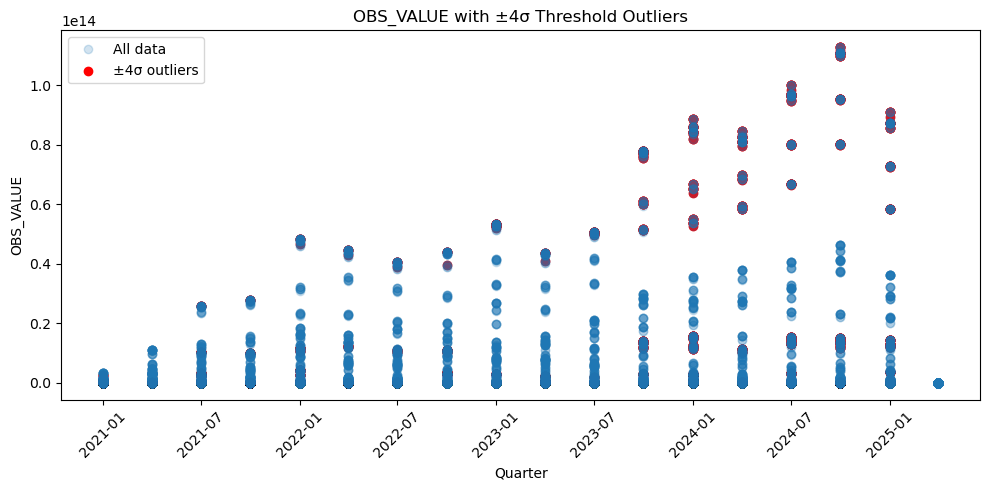

25/05/05 13:05:36 WARN TaskSetManager: Stage 479 contains a task of very large size (1029 KiB). The maximum recommended task size is 1000 KiB.


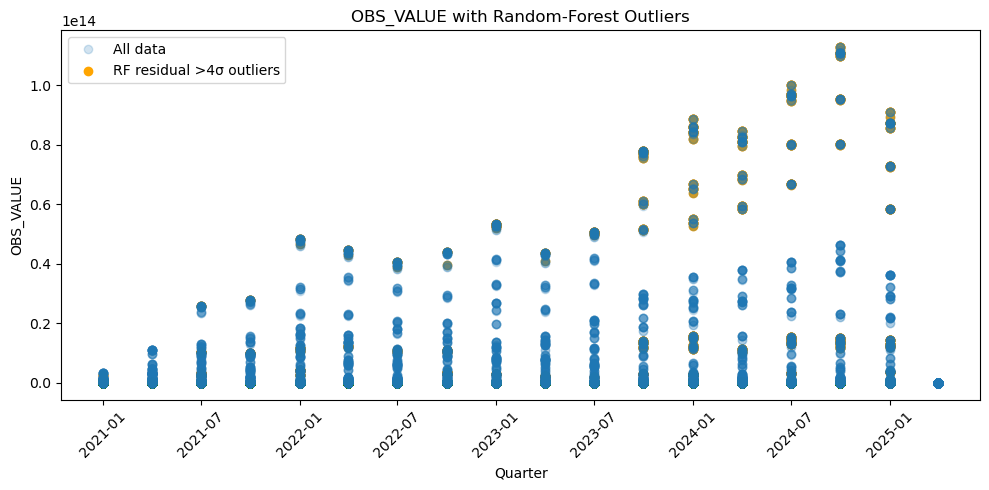

In [ ]:
# --- 1) σ-Threshold (4σ) Outliers ---

# pull into Pandas
pdf_thresh = df_thresh \
    .select('parsed_date','OBS_VALUE','is_outlier_4sd') \
    .toPandas()

# split
all_data   = pdf_thresh
outliers4σ = pdf_thresh[pdf_thresh['is_outlier_4sd']]

plt.figure(figsize=(10,5))
plt.plot(all_data['parsed_date'], all_data['OBS_VALUE'],
         marker='o', linestyle='', alpha=0.2, label='All data')
plt.scatter(outliers4σ['parsed_date'], outliers4σ['OBS_VALUE'],
            color='red', label='±4σ outliers')
plt.xlabel('Quarter')
plt.ylabel('OBS_VALUE')
plt.title('OBS_VALUE with ±4σ Threshold Outliers')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


# --- 2) Random-Forest Residual (>4σ) Outliers ---

# pull into Pandas
pdf_rfr = df_rfr \
    .select('parsed_date','OBS_VALUE','is_outlier_rfr') \
    .toPandas()

all_data_rfr   = pdf_rfr
rfr_outliers   = pdf_rfr[pdf_rfr['is_outlier_rfr']]

plt.figure(figsize=(10,5))
plt.plot(all_data_rfr['parsed_date'], all_data_rfr['OBS_VALUE'],
         marker='o', linestyle='', alpha=0.2, label='All data')
plt.scatter(rfr_outliers['parsed_date'], rfr_outliers['OBS_VALUE'],
            color='orange', label='RF residual >4σ outliers')
plt.xlabel('Quarter')
plt.ylabel('OBS_VALUE')
plt.title('OBS_VALUE with Random-Forest Outliers')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### 10. Trying with the different outlay of data:

In [ ]:
import pandas as pd
cs1 = pd.read_csv('exp/export.csv')
cs2 = pd.read_csv('exp/export(1).csv')
cs3 = pd.read_csv('exp/export(2).csv')
cs4 = pd.read_csv('exp/export(3).csv')
cs5 = pd.read_csv('exp/export(4).csv')

comp = pd.concat([cs1, cs2, cs3, cs4, cs5], axis=0)
comp.head(10)

,Prospectus Type,Document Type,Last Passporting Date,Approval or filing date,Home Member State,Securities Type,ISIN,First Passporting Date,Last Update Date,National Document ID,Consideration offered,Issuer(s) Name / LEI,Host Member State(s)
0,Base Prospectus,"Final terms, including the summary of the ind...",NaN,24/05/2025,CZECHIA,Debt with denomination < €100.000,CZ0003572414,NaN,26/04/2025,FTWS664847,Max 340000000,Českomoravská Projektová VII a.s. - 31570006FB...,NaN
1,Base Prospectus,"Final terms, including the summary of the ind...",NaN,24/04/2025,CZECHIA,Debt with denomination < €100.000,CZ0003572273,NaN,25/04/2025,FTWS663992,Max 100000000,WOOD SEEDS s.r.o. - 3157004CFGD745LKYZ81,NaN
2,Base Prospectus,"Final terms, including the summary of the ind...",NaN,24/04/2025,CZECHIA,Debt with denomination < €100.000,CZ0003572422,NaN,26/04/2025,FTWS664848,Max 200000000,Českomoravská Projektová VII a.s. - 31570006FB...,NaN
3,Base Prospectus,"Final terms, including the summary of the ind...",NaN,24/04/2025,CZECHIA,Debt with denomination < €100.000,CZ0003572406,NaN,26/04/2025,FTWS664849,Max 200000000,Českomoravská Projektová VII a.s. - 31570006FB...,NaN
4,Base Prospectus,"Final terms, including the summary of the ind...",NaN,24/04/2025,CZECHIA,Debt with denomination < €100.000,CZ0003572042,NaN,26/04/2025,FTWS664853,Max 50000000,BICZ Bond 2024 CR s.r.o. - 3157006C8O37QWMV6H25,NaN
5,Base Prospectus,"Final terms, including the summary of the ind...",NaN,24/04/2025,CZECHIA,Debt with denomination < €100.000,CZ0003572059,NaN,26/04/2025,FTWS665000,Max 150000000,BICZ Bond 2024 CR s.r.o. - 3157006C8O37QWMV6H25,NaN
6,Base Prospectus,"Final terms, including the summary of the ind...",NaN,24/04/2025,CZECHIA,Debt with denomination < €100.000,CZ0003572075,NaN,26/04/2025,FTWS665001,Max 1000000,BICZ Bond 2024 CR s.r.o. - 3157006C8O37QWMV6H25,NaN
7,Base Prospectus,"Final terms, including the summary of the ind...",NaN,24/04/2025,CZECHIA,Debt with denomination < €100.000,CZ0003572067,NaN,26/04/2025,FTWS664999,Max 100000000,BICZ Bond 2024 CR s.r.o. - 3157006C8O37QWMV6H25,NaN
8,Standalone Prospectus,Standalone prospectus,NaN,22/04/2025,CZECHIA,Shares,CZ0009013272,NaN,24/04/2025,STDA100844,From 160140000 to 266900000,ALEMAR Food Group a.s. - 315700L63KOVVLIKGM26,NaN
9,Standalone Prospectus,Standalone prospectus,NaN,22/04/2025,CZECHIA,Shares,CZ1008000831,NaN,24/04/2025,STDA100844,From 120000000 to 600000000,ALEMAR Food Group a.s. - 315700L63KOVVLIKGM26,NaN


#### I can make a function that is like convert to conventional format. And then I can apply Melisa outliers to that.

### 10. Unres

In [ ]:
pdf['parsed_date'].max()

Timestamp('2025-04-01 00:00:00')

In [ ]:
train_start = pdf['parsed_date'].min()
train_end = '2024-09-01'
test_start = '2024-09-01'
test_end = pdf['parsed_date'].max()

df = pdf

df['parsed_date'] = pd.to_datetime(df['parsed_date'])

forecaster = ForecasterRecursive(
    regressor = DecisionTreeRegressor(random_state=123),
    lags      = 30
)
train_mask = (df['parsed_date'] >= train_start) & (df['parsed_date'] <= train_end)
y_train = df.loc[train_mask, 'OBS_VALUE']
forecaster.fit(y=y_train)

test_mask = (df['parsed_date'] >= test_start) & (df['parsed_date'] <= test_end)
n_steps = int(test_mask.sum())

predictions_dt = forecaster.predict(steps=n_steps)


╭──────────────────────────────────── IndexWarning ────────────────────────────────────╮
│ Series has an unsupported index type (not pandas DatetimeIndex or RangeIndex). The   │
│ index will be replaced by a RangeIndex starting from 0 with a step of 1. To avoid    │
│ this warning, ensure that `y.index` is a DatetimeIndex with a frequency or a         │
│ RangeIndex.                                                                          │
│                                                                                      │
│ Category : IndexWarning                                                              │
│ Location :                                                                           │
│ /opt/anaconda3/envs/datasci/lib/python3.12/site-packages/skforecast/utils/utils.py:1 │
│ 411                                                                                  │
│ Suppress : warnings.simplefilter('ignore', category=IndexWarning)                    │
╰──────────────────────────────────────────────────────────────────────────────────────╯

╭──────────────────────────────────── IndexWarning ────────────────────────────────────╮
│ `last_window` has an unsupported index type (not pandas DatetimeIndex or             │
│ RangeIndex). The index will be replaced by a RangeIndex starting from 0 with a step  │
│ of 1. To avoid this warning, ensure that `last_window.index` is a DatetimeIndex with │
│ a frequency or a RangeIndex.                                                         │
│                                                                                      │
│ Category : IndexWarning                                                              │
│ Location :                                                                           │
│ /opt/anaconda3/envs/datasci/lib/python3.12/site-packages/skforecast/utils/utils.py:1 │
│ 468                                                                                  │
│ Suppress : warnings.simplefilter('ignore', category=IndexWarning)                    │
╰──────────────────────────────────────────────────────────────────────────────────────╯

In [ ]:
# fix the min filter in the .py file.

In [ ]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
arima = pm.AutoARIMA(seasonal=False)
arima.fit(y_train)
arima_test = arima.predict(n_periods=n_steps)

# === 4️⃣ Create index for predictions to align with dates ===
test_dates = df.loc[test_mask, 'parsed_date'].reset_index(drop=True)

# Make predictions series with dates
predictions_dt_series = pd.Series(predictions_dt, index=test_dates)
arima_test_series = pd.Series(arima_test, index=test_dates)

/opt/anaconda3/envs/datasci/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



In [ ]:
fig, ax = plt.subplots(figsize=(7, 3))
df.loc[test_start:test_end].plot(ax=ax, label = "Test")
predicted_test.plot(ax=ax, label = 'Predicted DT')
arima_test.plot(ax=ax, label = 'Predicted ARIMA')
ax.legend()

# change thisthngieee in the time package.


In [ ]:
## the rpoblem is that is threshold is not found... update it.

change the function for time to work with sql.